In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os, re,shutil,string
import pandas as pd
import seaborn as sns
import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras import losses



url = "https://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz"

# Specify the extract directory explicitly, ensuring no unnecessary subdirectory
dataset = tf.keras.utils.get_file("aclImdb_v1.tar.gz", url,
                                    untar=True, cache_dir='.',
                                    cache_subdir='')
# Expect the extracted data in the main cache_dir (which is '.' here)
# Construct the path to the dataset directory correctly
dataset_dir = os.path.join('/content/aclImdb_v1_extracted/aclImdb')
# or simply: dataset_dir = './aclImdb' if you specified cache_subdir='aclImdb'

training_dir = os.path.join(dataset_dir, 'train')
os.listdir(training_dir)

84125825/84125825 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


['unsupBow.feat',
 'urls_unsup.txt',
 'neg',
 'labeledBow.feat',
 'unsup',
 'pos',
 'urls_pos.txt',
 'urls_neg.txt']

In [ ]:
sample_file = os.path.join(training_dir, 'pos/1181_9.txt')
with open(sample_file) as sf:
  print(sf.read())

Rachel Griffiths writes and directs this award winning short film. A heartwarming story about coping with grief and cherishing the memory of those we've loved and lost. Although, only 15 minutes long, Griffiths manages to capture so much emotion and truth onto film in the short space of time. Bud Tingwell gives a touching performance as Will, a widower struggling to cope with his wife's death. Will is confronted by the harsh reality of loneliness and helplessness as he proceeds to take care of Ruth's pet cow, Tulip. The film displays the grief and responsibility one feels for those they have loved and lost. Good cinematography, great direction, and superbly acted. It will bring tears to all those who have lost a loved one, and survived.


In [ ]:
remove_dir = os.path.join(training_dir, 'unsup')
shutil.rmtree(remove_dir)

# remove_dir = os.path.join(training_dir, 'unsup/0_0.txt')
# shutil.rmtree(remove_dir)
# with open(remove_dir) as sf:
#   print(sf.read())

In [ ]:
raw_train_ds = tf.keras.preprocessing.text_dataset_from_directory(
    '/content/aclImdb_v1_extracted/aclImdb/train',
    batch_size=32,
    validation_split=0.2,
    subset='training',
    seed=42
)


Found 25000 files belonging to 2 classes.
Using 20000 files for training.


In [ ]:
for text_batch, label_batch in raw_train_ds.take(1):
    for i in range(3):
        print("Review",text_batch.numpy()[i])
        print("Label",label_batch.numpy()[i])

Review b'"Pandemonium" is a horror movie spoof that comes off more stupid than funny. Believe me when I tell you, I love comedies. Especially comedy spoofs. "Airplane", "The Naked Gun" trilogy, "Blazing Saddles", "High Anxiety", and "Spaceballs" are some of my favorite comedies that spoof a particular genre. "Pandemonium" is not up there with those films. Most of the scenes in this movie had me sitting there in stunned silence because the movie wasn\'t all that funny. There are a few laughs in the film, but when you watch a comedy, you expect to laugh a lot more than a few times and that\'s all this film has going for it. Geez, "Scream" had more laughs than this film and that was more of a horror film. How bizarre is that?<br /><br />*1/2 (out of four)'
Label 0
Review b"David Mamet is a very interesting and a very un-equal director. His first movie 'House of Games' was the one I liked best, and it set a series of films with characters whose perspective of life changes as they get into 

In [ ]:
print("Label 0 corresponds to ", raw_train_ds.class_names[0])
print("Label 1 corresponds to ", raw_train_ds.class_names[1])

Label 0 corresponds to  neg
Label 1 corresponds to  pos


In [ ]:
raw_train_ds.class_names
# raw_train_ds

['neg', 'pos']

In [ ]:
raw_val_ds=tf.keras.utils.text_dataset_from_directory(
    '/content/aclImdb_v1_extracted/aclImdb/train',
    batch_size=32,
    validation_split=0.2,
    subset='validation',
    seed=42
)


Found 25000 files belonging to 2 classes.
Using 5000 files for validation.


In [ ]:
raw_test_ds=tf.keras.utils.text_dataset_from_directory(
    '/content/aclImdb_v1_extracted/aclImdb/test',
    batch_size=32
)

Found 25000 files belonging to 2 classes.


In [ ]:
def custom_standardization(input_data):
  lowercase = tf.strings.lower(input_data)
  stripped_html = tf.strings.regex_replace(lowercase, '<br />', ' ')
  return tf.strings.regex_replace(stripped_html,
                                  '[%s]' % re.escape(string.punctuation),
                                  '')

In [ ]:
max_features=10000
sequence_length=250

vectorized_layer=layers.TextVectorization(
    standardize=custom_standardization,
    max_tokens=max_features,
    output_mode='int',
    output_sequence_length=sequence_length
)

# make a text-only dataset without labels, then call adapt
train_text=raw_train_ds.map(lambda x,y:x)
vectorized_layer.adapt(train_text)
vectorized_layer

<TextVectorization name=text_vectorization, built=False>

In [ ]:
def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  return vectorized_layer(text), label

In [ ]:

# retrieve a batch (of 32 reviews and labels) from the dataset
text_batch, label_batch = next(iter(raw_train_ds))
first_review, first_label = text_batch[0], label_batch[0]
print("Review", first_review)
print("Label", raw_train_ds.class_names[first_label])
print("Vectorized review", vectorize_text(first_review, first_label))

Review tf.Tensor(b'Silent Night, Deadly Night 5 is the very last of the series, and like part 4, it\'s unrelated to the first three except by title and the fact that it\'s a Christmas-themed horror flick.<br /><br />Except to the oblivious, there\'s some obvious things going on here...Mickey Rooney plays a toymaker named Joe Petto and his creepy son\'s name is Pino. Ring a bell, anyone? Now, a little boy named Derek heard a knock at the door one evening, and opened it to find a present on the doorstep for him. Even though it said "don\'t open till Christmas", he begins to open it anyway but is stopped by his dad, who scolds him and sends him to bed, and opens the gift himself. Inside is a little red ball that sprouts Santa arms and a head, and proceeds to kill dad. Oops, maybe he should have left well-enough alone. Of course Derek is then traumatized by the incident since he watched it from the stairs, but he doesn\'t grow up to be some killer Santa, he just stops talking.<br /><br />T

In [ ]:
# print(len(first_review))
print(len(vectorize_text(first_review, first_label)))
print(vectorize_text(first_review,first_label))

2
(<tf.Tensor: shape=(1, 250), dtype=int64, numpy=
array([[1287,  313, 2380,  313,  661,    7,    2,   52,  229,    5,    2,
         200,    3,   38,  170,  669,   29, 5492,    6,    2,   83,  297,
         549,   32,  410,    3,    2,  186,   12,   29,    4,    1,  191,
         510,  549,    6,    2, 8229,  212,   46,  576,  175,  168,   20,
           1, 5361,  290,    4,    1,  761,  969,    1,    3,   24,  935,
        2271,  393,    7,    1, 1675,    4, 3747,  250,  148,    4,  112,
         436,  761, 3529,  548,    4, 3633,   31,    2, 1331,   28, 2096,
           3, 2912,    9,    6,  163,    4, 1006,   20,    2,    1,   15,
          85,   53,  147,    9,  292,   89,  959, 2314,  984,   27,  762,
           6,  959,    9,  564,   18,    7, 2140,   32,   24, 1254,   36,
           1,   85,    3, 3298,   85,    6, 1410,    3, 1936,    2, 3408,
         301,  965,    7,    4,  112,  740, 1977,   12,    1, 2014, 2772,
           3,    4,  428,    3, 5177,    6,  512, 1254,    1,

In [ ]:
print("1287 ---> ",vectorized_layer.get_vocabulary()[1287])
print(" 313 ---> ",vectorized_layer.get_vocabulary()[313])
print('Vocabulary size: {}'.format(len(vectorized_layer.get_vocabulary())))

1287 --->  silent
 313 --->  night
Vocabulary size: 10000


In [ ]:
# Get the vocabulary using get_vocabulary()
vocabulary = vectorized_layer.get_vocabulary()

# Print or use the maximum value
print("Vocabulary:", len(vocabulary))

Vocabulary: 10000


In [ ]:

train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

In [ ]:
# Inspect train_ds
print("Inspecting train_ds:")
for text_batch, label_batch in train_ds.take(1):  # Take one batch
    for i in range(5):  # Print the first 5 elements of the batch
        print("Review (vectorized):", text_batch.numpy()[i])
        print("Label:", label_batch.numpy()[i])
    print("...")  # Indicate that there are more elements in the batch

# Similarly, inspect val_ds and test_ds
print("\nInspecting val_ds:")
for text_batch, label_batch in val_ds.take(1):
    for i in range(5):
        print("Review (vectorized):", text_batch.numpy()[i])
        print("Label:", label_batch.numpy()[i])
    print("...")

print("\nInspecting test_ds:")
for text_batch, label_batch in test_ds.take(1):
    for i in range(5):
        print("Review (vectorized):", text_batch.numpy()[i])
        print("Label:", label_batch.numpy()[i])
    print("...")

Inspecting train_ds:
Review (vectorized): [  86   17  260    2  222    1  571   31  229   11 2418    1   51   22
   25  404  251   12  306  282    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0

In [ ]:
first_review

<tf.Tensor: shape=(), dtype=string, numpy=b'Silent Night, Deadly Night 5 is the very last of the series, and like part 4, it\'s unrelated to the first three except by title and the fact that it\'s a Christmas-themed horror flick.<br /><br />Except to the oblivious, there\'s some obvious things going on here...Mickey Rooney plays a toymaker named Joe Petto and his creepy son\'s name is Pino. Ring a bell, anyone? Now, a little boy named Derek heard a knock at the door one evening, and opened it to find a present on the doorstep for him. Even though it said "don\'t open till Christmas", he begins to open it anyway but is stopped by his dad, who scolds him and sends him to bed, and opens the gift himself. Inside is a little red ball that sprouts Santa arms and a head, and proceeds to kill dad. Oops, maybe he should have left well-enough alone. Of course Derek is then traumatized by the incident since he watched it from the stairs, but he doesn\'t grow up to be some killer Santa, he just st

In [ ]:
print(custom_standardization(first_review))

tf.Tensor(b'silent night deadly night 5 is the very last of the series and like part 4 its unrelated to the first three except by title and the fact that its a christmasthemed horror flick  except to the oblivious theres some obvious things going on heremickey rooney plays a toymaker named joe petto and his creepy sons name is pino ring a bell anyone now a little boy named derek heard a knock at the door one evening and opened it to find a present on the doorstep for him even though it said dont open till christmas he begins to open it anyway but is stopped by his dad who scolds him and sends him to bed and opens the gift himself inside is a little red ball that sprouts santa arms and a head and proceeds to kill dad oops maybe he should have left wellenough alone of course derek is then traumatized by the incident since he watched it from the stairs but he doesnt grow up to be some killer santa he just stops talking  theres a mysterious stranger lurking around who seems very interested

In [ ]:
label_batch[1]

<tf.Tensor: shape=(), dtype=int32, numpy=1>

#Overfitting and Underfitting


##2. Run model on Normalized Data

##Setting up a base model

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 14s 8ms/step - accuracy: 0.8107 - loss: 8.4545 - val_accuracy: 0.8891 - val_loss: 0.5041
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9000 - loss: 0.4211 - val_accuracy: 0.9152 - val_loss: 0.3624
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9240 - loss: 0.3015 - val_accuracy: 0.9278 - val_loss: 0.2996
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9325 - loss: 0.2553 - val_accuracy: 0.9303 - val_loss: 0.2754
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9405 - loss: 0.2257 - val_accuracy: 0.9388 - val_loss: 0.2386
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.9446 - loss: 0.2155 - val_accuracy: 0.9416 - val_loss: 0.2348
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 12s 5ms/step - accuracy: 0.9464 - loss: 0.2102 - val_accuracy: 0.9450 - val_loss: 0.2674
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9498 - loss: 0.196

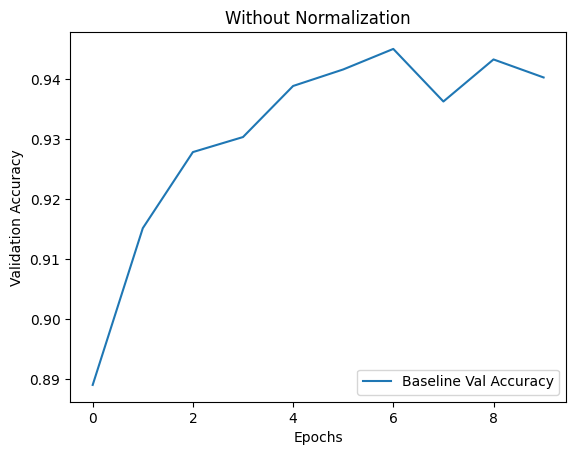

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.datasets import mnist

(x_train,y_train),(x_test,y_test)=mnist.load_data()

model=tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(28,28)),
    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dense(10,activation='softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
history_baseline=model.fit(x_train,y_train,epochs=10,validation_split=0.2,verbose=1)

plt.plot(history_baseline.history['val_accuracy'],label='Baseline Val Accuracy')
plt.title('Without Normalization')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend(loc='lower right')
plt.show()


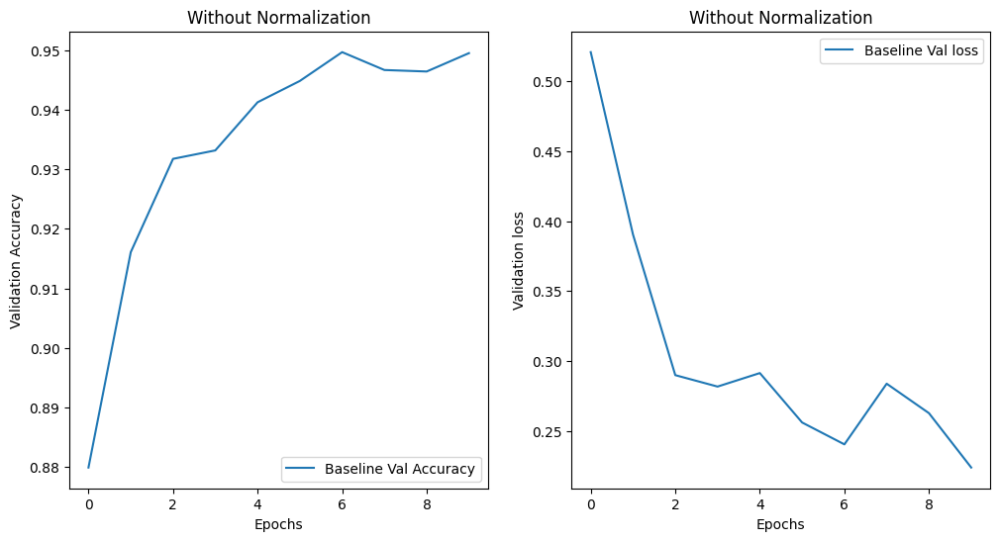

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(history_baseline.history['val_accuracy'],label='Baseline Val Accuracy')
plt.title('Without Normalization')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend(loc='lower right')
plt.subplot(1,2,2)
plt.plot(history_baseline.history['val_loss'],label='Baseline Val loss')
plt.title('Without Normalization')
plt.xlabel('Epochs')
plt.ylabel('Validation loss')
plt.legend(loc='upper right')

## 2. With preprocessing normalization

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8674 - loss: 0.4725 - val_accuracy: 0.9553 - val_loss: 0.1532
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9614 - loss: 0.1367 - val_accuracy: 0.9620 - val_loss: 0.1246
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9719 - loss: 0.0930 - val_accuracy: 0.9667 - val_loss: 0.1122
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9819 - loss: 0.0638 - val_accuracy: 0.9710 - val_loss: 0.0952
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.9853 - loss: 0.0479 - val_accuracy: 0.9718 - val_loss: 0.0923
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9888 - loss: 0.0352 - val_accuracy: 0.9747 - val_loss: 0.0877
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.9920 - loss: 0.0283 - val_accuracy: 0.9745 - val_loss: 0.0879
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9942 - loss: 0.0214

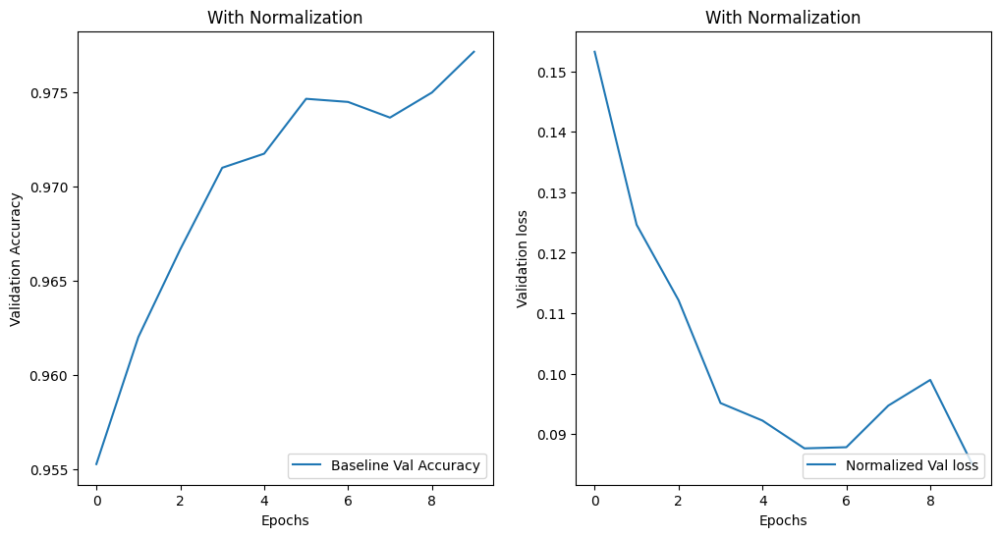

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Flatten

(x_train,y_train),(x_test,y_test)=mnist.load_data()

x_train_transformed=x_train/255.0
x_test_transformed=x_test/255.0

model=Sequential([
    Flatten(input_shape=(28,28)),
    Dense(128,activation='relu'),
    Dense(10,activation='softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

model_with_norm_data=model.fit(x_train_transformed,y_train,epochs=10,validation_split=0.2,verbose=1)


plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(model_with_norm_data.history['val_accuracy'],label='Baseline Val Accuracy')
plt.title('With Normalization')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(model_with_norm_data.history['val_loss'],label='Normalized Val loss')
plt.title('With Normalization')
plt.xlabel('Epochs')
plt.ylabel('Validation loss')
plt.legend(loc='lower right')
plt.show()

## 3. Adding Dropout Layer

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8385 - loss: 0.5407 - val_accuracy: 0.9542 - val_loss: 0.1602
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9504 - loss: 0.1711 - val_accuracy: 0.9662 - val_loss: 0.1126
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.9650 - loss: 0.1154 - val_accuracy: 0.9701 - val_loss: 0.0977
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9708 - loss: 0.0980 - val_accuracy: 0.9750 - val_loss: 0.0836
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9762 - loss: 0.0787 - val_accuracy: 0.9743 - val_loss: 0.0882
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9771 - loss: 0.0702 - val_accuracy: 0.9771 - val_loss: 0.0776
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9815 - loss: 0.0599 - val_accuracy: 0.9764 - val_loss: 0.0816
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9826 - loss: 0.0504

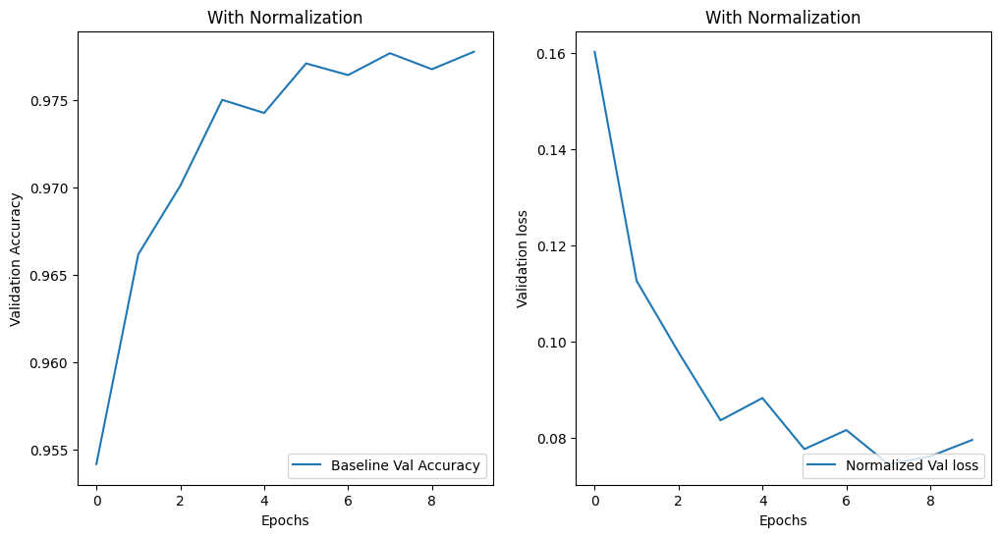

In [ ]:
model=Sequential([
    Flatten(input_shape=(28,28)),
    Dense(128,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    Dense(10,activation='softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

model_with_dropout_layer=model.fit(x_train_transformed,y_train,epochs=10,validation_split=0.2,verbose=1)

# history['val_accuracy']
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(model_with_dropout_layer.history['val_accuracy'],label='Baseline Val Accuracy')
plt.title('With Normalization')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(model_with_dropout_layer.history['val_loss'],label='Normalized Val loss')
plt.title('With Normalization')
plt.xlabel('Epochs')
plt.ylabel('Validation loss')
plt.legend(loc='lower right')
plt.show()

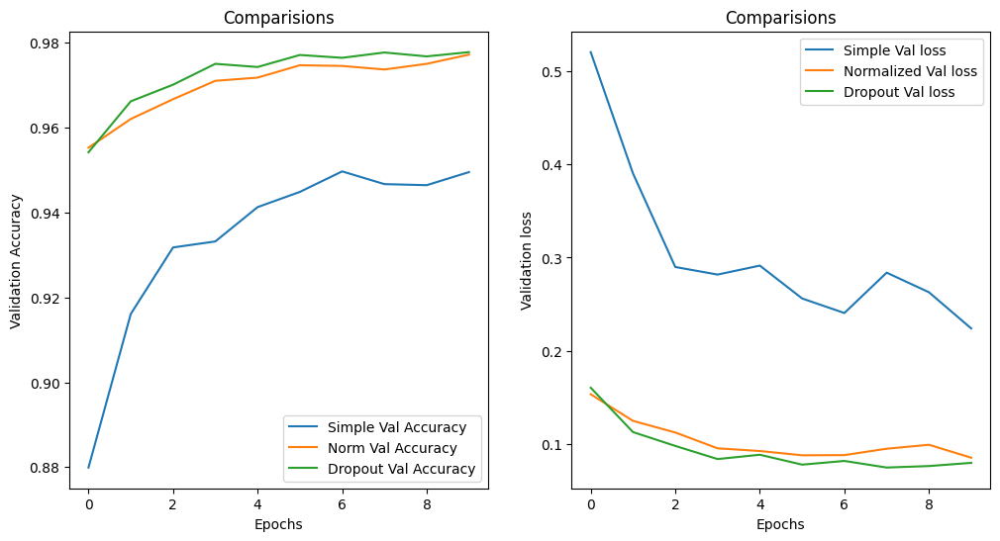

In [ ]:
# history['val_accuracy']
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(history_baseline.history['val_accuracy'],label='Simple Val Accuracy')
plt.plot(model_with_norm_data.history['val_accuracy'],label='Norm Val Accuracy')
plt.plot(model_with_dropout_layer.history['val_accuracy'],label='Dropout Val Accuracy')
plt.title('Comparisions')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(history_baseline.history['val_loss'],label='Simple Val loss')
plt.plot(model_with_norm_data.history['val_loss'],label='Normalized Val loss')
plt.plot(model_with_dropout_layer.history['val_loss'],label='Dropout Val loss')
plt.title('Comparisions')
plt.xlabel('Epochs')
plt.ylabel('Validation loss')
plt.legend(loc='upper right')
plt.show()

## 4. Early Stoping or callback

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8794 - loss: 0.4026 - val_accuracy: 0.9557 - val_loss: 0.1507
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9618 - loss: 0.1289 - val_accuracy: 0.9597 - val_loss: 0.1300
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9715 - loss: 0.0927 - val_accuracy: 0.9671 - val_loss: 0.1084
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9777 - loss: 0.0735 - val_accuracy: 0.9705 - val_loss: 0.1007
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9811 - loss: 0.0614 - val_accuracy: 0.9704 - val_loss: 0.0997
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9826 - loss: 0.0554 - val_accuracy: 0.9724 - val_loss: 0.0945
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9850 - loss: 0.0463 - val_accuracy: 0.9721 - val_loss: 0.0998
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9866 - loss: 0.041

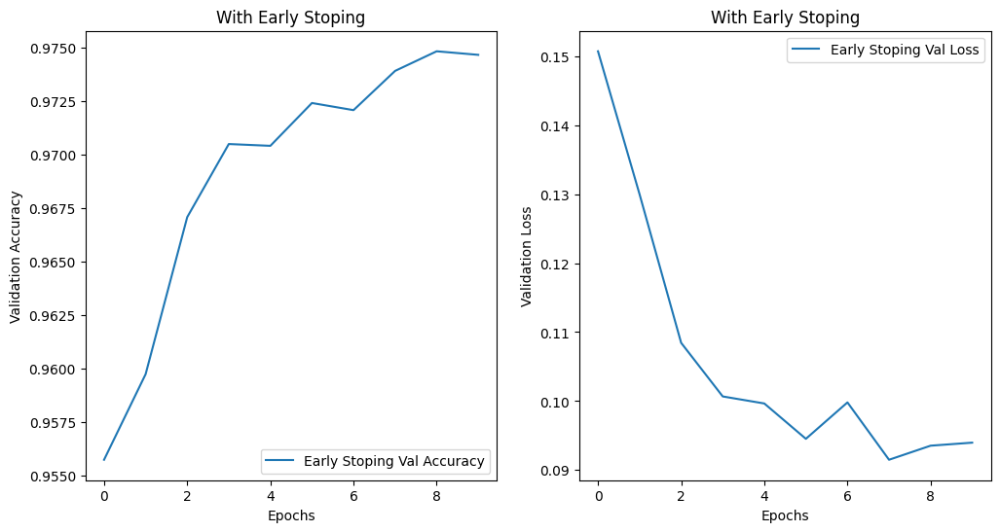

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf
from tensorflow.keras.layers import BatchNormalization

# Built-in layers
model=Sequential([
    Flatten(input_shape=(28,28)),
    Dense(128,activation='relu'),
    BatchNormalization(),
    Dense(10,activation='softmax')
])

model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

early_stopping=EarlyStopping(monitor='val_loss',patience=3,restore_best_weights=True)

model_with_early_stopping=model.fit(x_train_transformed,y_train,epochs=10,validation_split=0.2,verbose=1,callbacks=[early_stopping])

#ploting validation accuracy and loss
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(model_with_early_stopping.history['val_accuracy'],label='Early Stoping Val Accuracy')
plt.title('With Early Stoping')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(model_with_early_stopping.history['val_loss'],label='Early Stoping Val Loss')
plt.title('With Early Stoping')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend(loc='upper right')

## 5. Regularization (L1 / L2)

In [ ]:
from tensorflow.keras.regularizers import l1,l2,l1_l2

model_with_l1=Sequential([
    Flatten(input_shape=(28,28)),
    Dense(128,activation='relu',kernel_regularizer=l1(0.0001)),
    Dense(10,activation='softmax')
])
model_with_l2=Sequential([
    Flatten(input_shape=(28,28)),
    Dense(128,activation='relu',kernel_regularizer=l2(0.0001)),
    Dense(10,activation='softmax')
])
model_with_l1_and_l2=Sequential([
    Flatten(input_shape=(28,28)),
    Dense(128,activation='relu',kernel_regularizer=l1_l2(0.0001,0.0001)),
    Dense(10,activation='softmax')
])

model_with_l1.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy','percision','f1_score'])
model_with_l2.compile(optimizer='sgd',loss='sparse_categorical_crossentropy',metrics=['accuracy','percision','f1_score'])
model_with_l1_and_l2.compile(optimizer='adagrad',loss='sparse_categorical_crossentropy',metrics=['accuracy','percision','f1_score'])
# model.compile(optimizer='rmsprop',loss='sparse_categorical_crossentropy',metrics=['accuracy','percision'])

history_of_l1=model.fit(x_train_transformed,y_train,epochs=10,validation_split=0.2,verbose=1)
history_of_l2=model.fit(x_train_transformed,y_train,epochs=10,validation_split=0.2,verbose=1)
history_of_l1_and_l2=model.fit(x_train_transformed,y_train,epochs=10,validation_split=0.2,verbose=1)




/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9869 - loss: 0.0401 - val_accuracy: 0.9754 - val_loss: 0.0916
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9886 - loss: 0.0364 - val_accuracy: 0.9736 - val_loss: 0.0890
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.9889 - loss: 0.0318 - val_accuracy: 0.9771 - val_loss: 0.0894
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9908 - loss: 0.0279 - val_accuracy: 0.9740 - val_loss: 0.0988
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.9920 - loss: 0.0253 - val_accuracy: 0.9768 - val_loss: 0.0920
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.9926 - loss: 0.0232 - val_accuracy: 0.9770 - val_loss: 0.0943
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9920 - loss: 0.0241 - val_accuracy: 0.9783 - val_loss: 0.0963
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9939 - loss: 0.0204

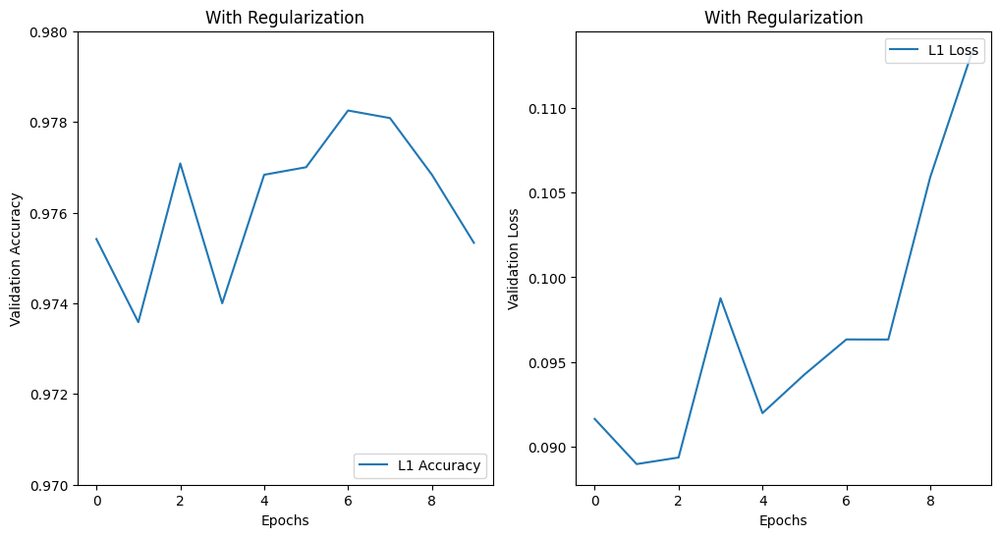

In [ ]:
#ploting validation accuracy and loss
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(history_of_l1.history['val_accuracy'],label='L1 Accuracy')
plt.title('With Regularization')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.ylim(0.97,0.98)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(history_of_l1.history['val_loss'],label='L1 Loss')
plt.title('With Regularization')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')

plt.legend(loc='upper right')

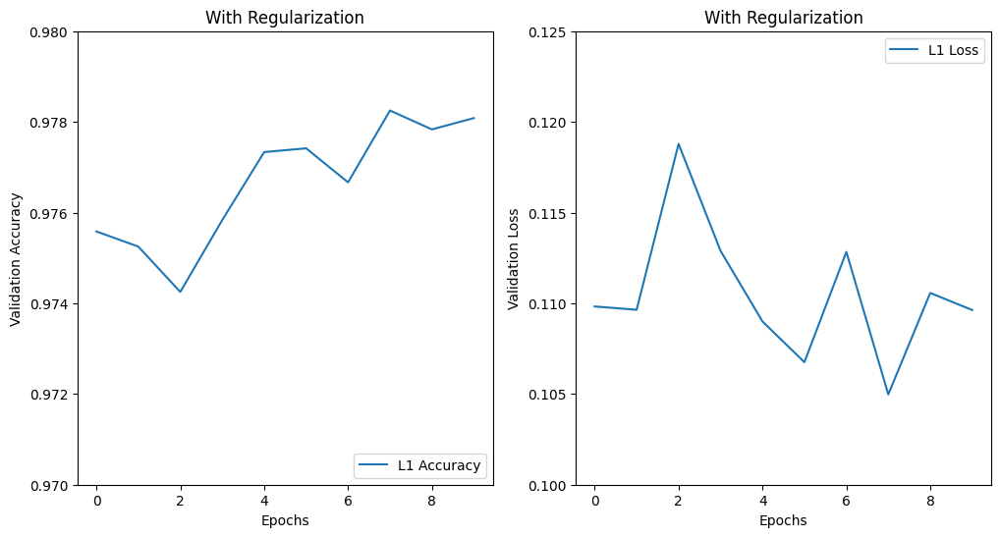

In [ ]:
#ploting validation accuracy and loss
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(history_of_l2.history['val_accuracy'],label='L1 Accuracy')
plt.title('With Regularization')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.ylim(0.97,0.98)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(history_of_l2.history['val_loss'],label='L1 Loss')
plt.title('With Regularization')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.ylim(0.100,0.125)
plt.legend(loc='upper right')

In [ ]:
np.mean(history_of_l1.history['accuracy'])
history_of_l1_and_l2.history

{'accuracy': [0.995395839214325,
  0.995437502861023,
  0.9960416555404663,
  0.9958750009536743,
  0.9957916736602783,
  0.9959583282470703,
  0.9962083101272583,
  0.9959791898727417,
  0.9966874718666077,
  0.996791660785675],
 'loss': [0.012808921746909618,
  0.013328244909644127,
  0.01098994817584753,
  0.012252305634319782,
  0.0117311030626297,
  0.01251660194247961,
  0.011181209236383438,
  0.011702464893460274,
  0.010097659192979336,
  0.009546960704028606],
 'val_accuracy': [0.9777500033378601,
  0.9750833511352539,
  0.9776666760444641,
  0.9771666526794434,
  0.9778333306312561,
  0.9776666760444641,
  0.9763333201408386,
  0.9775000214576721,
  0.9778333306312561,
  0.9763333201408386],
 'val_loss': [0.1148548275232315,
  0.1282849758863449,
  0.11485816538333893,
  0.11923795938491821,
  0.1150301918387413,
  0.1195029616355896,
  0.11929360777139664,
  0.11466171592473984,
  0.12052121758460999,
  0.13595275580883026]}

##6. K-fold cross validation

In [ ]:
import numpy as np
from sklearn.model_selection import KFold
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten,Dense
from tensorflow.keras.utils import to_categorical

(x_train,y_train),(x_test,y_test)=mnist.load_data()

x_train_transformed=x_train/255.0
x_test_transformed=x_test/255.0
y_train_categorical=to_categorical(y_train,10)

def create_model():
    model=Sequential([
        Flatten(input_shape=(28,28)),
        Dense(128,activation='relu'),
        Dense(10,activation='softmax')
    ])
    model.compile(optimizer='sgd',loss='categorical_crossentropy',metrics=['accuracy'])
    return model

k=5
kf=KFold(n_splits=k,shuffle=True)

fold_index=1
scores=[]

for train_index,val_index in kf.split(x_train_transformed):
    x_train_fold,x_val_fold=x_train_transformed[train_index],x_train_transformed[val_index]
    y_train_fold,y_val_fold=y_train_categorical[train_index],y_train_categorical[val_index]
    model_kfold_cv=create_model()
    history_kfold_cv=model_kfold_cv.fit(x_train_fold,y_train_fold,epochs=10,validation_data=(x_val_fold,y_val_fold),verbose=1)
    scores.append([history_kfold_cv.history['val_loss'][-1],history_kfold_cv.history['val_accuracy'][-1]])

avg_loss,avg_accuracy=np.mean(scores,axis=0)
print(f'K-fold Validation Result:\nAverage Loss: {avg_loss}, Average Accuracy: {avg_accuracy}')

# ploting
folds=range(1,k+1)
val_losses,validation_accuracies=zip(*scores)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(folds,val_losses,marker='o',label='Validation Loss')
plt.plot(folds,[avg_loss]*k,'r--',label='Average Loss')
plt.xlabel('Folds')
plt.ylabel('Loss')
plt.title('K-fold Validation Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(folds,validation_accuracies,marker='o',label='Validation Accuracy')
plt.plot(folds,[avg_accuracy]*k,'r--',label='Average Accuracy')
plt.xlabel('Folds')
plt.ylabel('Accuracy')
plt.title('K-fold Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7137 - loss: 1.1262 - val_accuracy: 0.8919 - val_loss: 0.4007
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8930 - loss: 0.3885 - val_accuracy: 0.9100 - val_loss: 0.3279
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9079 - loss: 0.3240 - val_accuracy: 0.9202 - val_loss: 0.2932
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9196 - loss: 0.2868 - val_accuracy: 0.9261 - val_loss: 0.2706
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9265 - loss: 0.2627 - val_accuracy: 0.9312 - val_loss: 0.2505
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9310 - loss: 0.2477 - val_accuracy: 0.9352 - val_loss: 0.2358
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9365 - loss: 0.2279 - val_accuracy: 0.9373 - val_loss: 0.2239
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.9409 - loss: 0.2075 -

NameError: name 'plt' is not defined

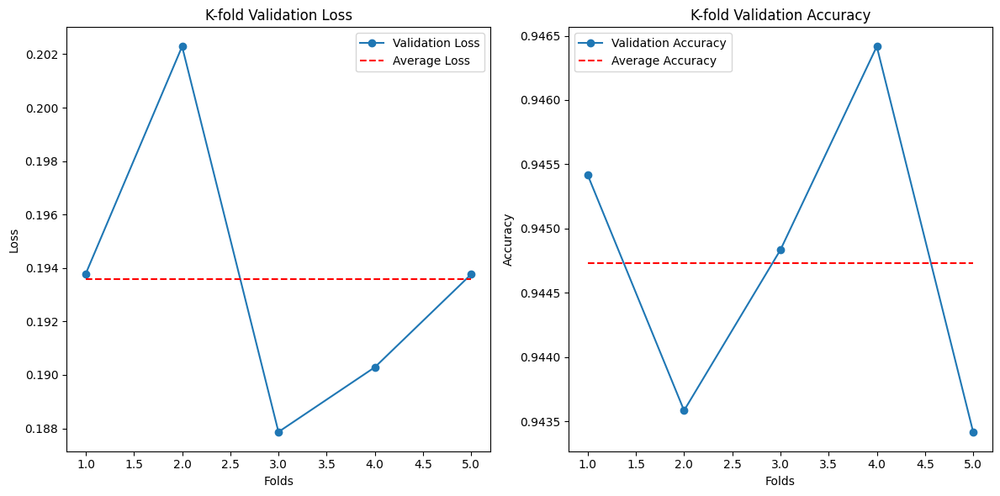

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd


plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(folds,val_losses,marker='o',label='Validation Loss')
plt.plot(folds,[avg_loss]*k,'r--',label='Average Loss')
plt.xlabel('Folds')
plt.ylabel('Loss')
plt.title('K-fold Validation Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(folds,validation_accuracies,marker='o',label='Validation Accuracy')
plt.plot(folds,[avg_accuracy]*k,'r--',label='Average Accuracy')
plt.xlabel('Folds')
plt.ylabel('Accuracy')
plt.title('K-fold Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


#Transfer Learning

In [ ]:
%%time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.layers import Dense,Flatten,GlobalAveragePooling2D
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras.layers import GlobalAveragePooling2D
(x_train,y_train),(x_test,y_test)=cifar10.load_data()


y_train_categorical=to_categorical(y_train,10)
y_test_categorical=to_categorical(y_test,10)
x_train_transformed=x_train/255
x_test_transformed=x_test/255

#Data Augmentation
data_generation=ImageDataGenerator(
    featurewise_center=False,
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    zoom_range=0.1,
    fill_mode='nearest'
)
data_generation.fit(x_train_transformed)


#load mobile net v2 without the top layer
base_model=MobileNetV2(weights='imagenet',include_top=False,input_shape=(32,32,3))

#Freeze the base model
base_model.trainable=False

#Add custom layers on top for our task
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) #new FC layer,random init
predictions=Dense(10,activation='softmax')(x) #new softmax layer

#define the main model
model=Model(inputs=base_model.input,outputs=predictions)

# Compile and train the model
model.compile(optimizer=tf.keras.optimizers.SGD(),loss='categorical_crossentropy',metrics=['accuracy'])

history=model.fit(data_generation.flow(x_train_transformed,y_train_categorical,batch_size=32),
                  steps_per_epoch=int(len(x_train)/32),epochs=10,
                  validation_data=(x_test_transformed,y_test_categorical),
                  verbose=1)


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


<timed exec>:39: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1562/1562 ━━━━━━━━━━━━━━━━━━━━ 58s 30ms/step - accuracy: 0.1813 - loss: 2.2299 - val_accuracy: 0.2451 - val_loss: 2.0871
Epoch 2/10
   1/1562 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - accuracy: 0.0938 - loss: 2.1799

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.0938 - loss: 2.1799 - val_accuracy: 0.2455 - val_loss: 2.0869
Epoch 3/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 63s 22ms/step - accuracy: 0.2455 - loss: 2.0719 - val_accuracy: 0.2652 - val_loss: 2.0262
Epoch 4/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1562 - loss: 2.0059 - val_accuracy: 0.2643 - val_loss: 2.0260
Epoch 5/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - accuracy: 0.2667 - loss: 2.0216 - val_accuracy: 0.2739 - val_loss: 1.9961
Epoch 6/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.1875 - loss: 2.0663 - val_accuracy: 0.2736 - val_loss: 1.9962
Epoch 7/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - accuracy: 0.2744 - loss: 1.9946 - val_accuracy: 0.2817 - val_loss: 1.9788
Epoch 8/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 989us/step - accuracy: 0.3750 - loss: 1.9462 - val_accuracy: 0.2818 - val_loss: 1.9782
Epoch 9/10
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - accuracy: 0.2834 - loss: 1.9721 - v

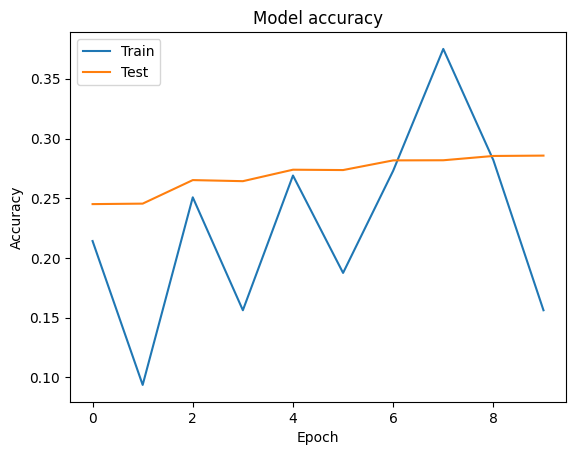

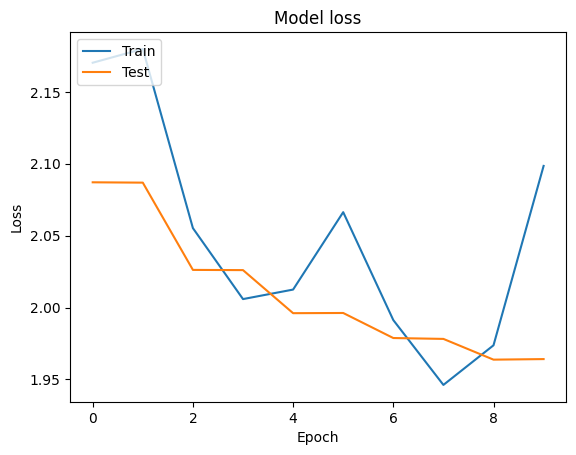

In [ ]:

import matplotlib.pyplot as plt
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
import torch
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device


'cuda'

##Fine-Tuning

Epoch 1/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 66s 30ms/step - accuracy: 0.5831 - loss: 1.1913 - val_accuracy: 0.6365 - val_loss: 1.0527
Epoch 2/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7188 - loss: 0.8095 - val_accuracy: 0.6362 - val_loss: 1.0523
Epoch 3/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 62s 23ms/step - accuracy: 0.6052 - loss: 1.1336 - val_accuracy: 0.6546 - val_loss: 1.0188
Epoch 4/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7500 - loss: 0.8579 - val_accuracy: 0.6551 - val_loss: 1.0163
Epoch 5/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - accuracy: 0.6205 - loss: 1.0864 - val_accuracy: 0.6649 - val_loss: 0.9845
Epoch 6/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7500 - loss: 0.8387 - val_accuracy: 0.6644 - val_loss: 0.9845
Epoch 7/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - accuracy: 0.6313 - loss: 1.0499 - val_accuracy: 0.6784 - val_loss: 0.9521
Epoch 8/25
1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.6562 - loss: 1

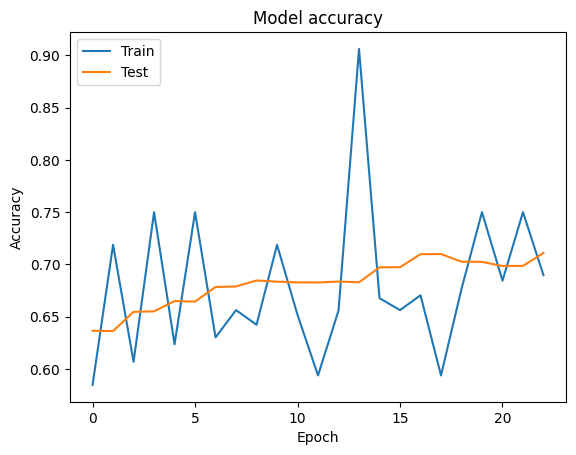

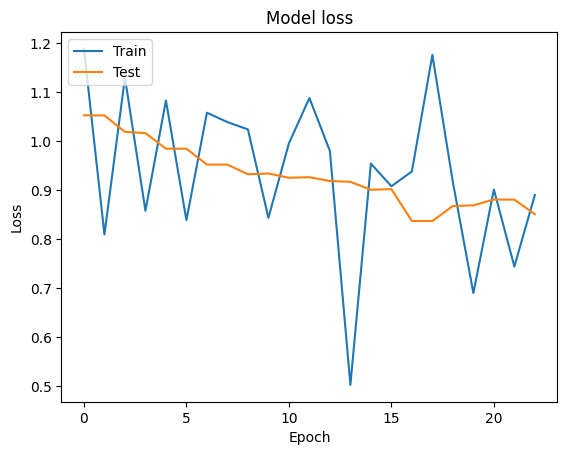

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping=EarlyStopping(monitor='val_loss',patience=5)
# Unfreeze some layers in the base model
base_model.trainable = True
fine_tune_at = 100  # This is the number of layers from the top to freeze
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Recompile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Continue training
history_fine = model.fit(data_generation.flow(x_train_transformed, y_train_categorical, batch_size=32),
                         steps_per_epoch=int(len(x_train) / 32), epochs=25,
                         validation_data=(x_test_transformed, y_test_categorical), verbose=1,callbacks=[early_stopping])



# Plot training & validation accuracy values
plt.plot(history_fine.history['accuracy'])
plt.plot(history_fine.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_fine.history['loss'])
plt.plot(history_fine.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

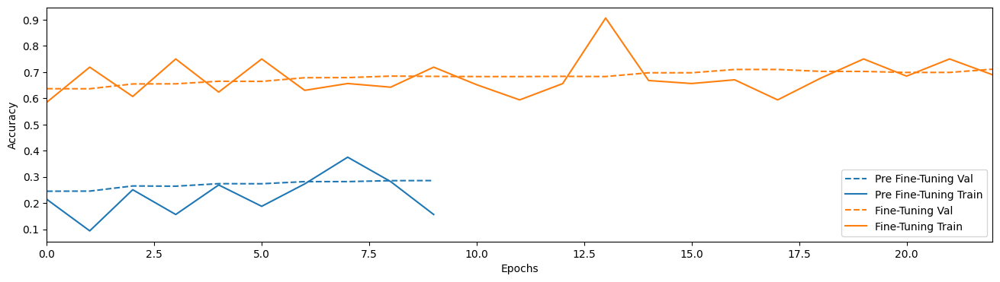

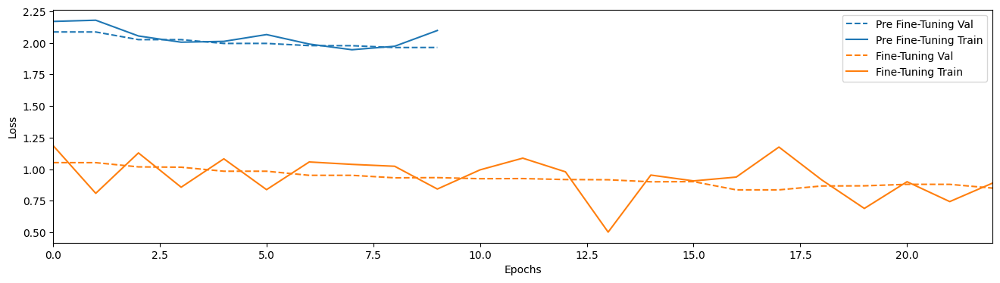

In [ ]:

import matplotlib.pyplot as plt

def plot_history(histories, key='accuracy'):
    plt.figure(figsize=(16, 4))

    for name, history in histories:
        val = plt.plot(history.epoch, history.history['val_'+key],
                       '--', label=name.title()+' Val')
        plt.plot(history.epoch, history.history[key], color=val[0].get_color(),
                 label=name.title()+' Train')

    plt.xlabel('Epochs')
    plt.ylabel(key.replace('_', ' ').title())
    plt.legend()
    plt.xlim([0, max(history.epoch)])

# Plot accuracy
plot_history([('Pre Fine-Tuning', history),
              ('Fine-Tuning', history_fine)],
             key='accuracy')

# Plot loss
plot_history([('Pre Fine-Tuning', history),
              ('Fine-Tuning', history_fine)],
             key='loss')

In [ ]:
y_train_categorical.shape
y_train_df=pd.DataFrame(y_train_categorical)
y_train_df

,0,1,2,3,4,5,6,7,8,9
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
49995,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
49996,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
49997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
49998,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(10000, 32, 32, 3)
(50000, 1)
(10000, 1)


[1]


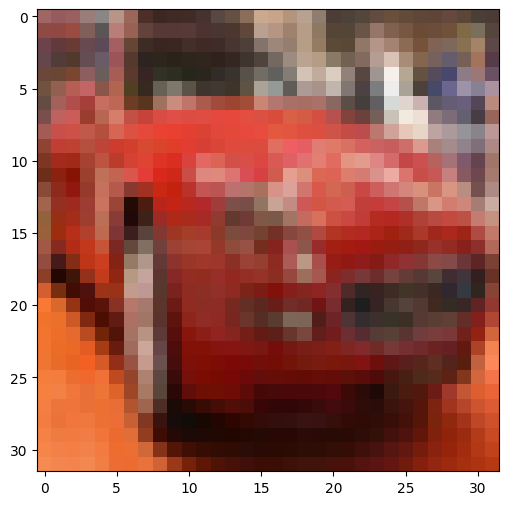

In [ ]:
print(y_train[5])
plt.figure(figsize=(12,6))
plt.imshow(x_train[5])

In [ ]:
y_train.min()
y_train.max()

np.uint8(9)

In [ ]:
x_train_df=pd.DataFrame(y_train)
# x_test_df=pd.DataFrame(x_test)
x_train_df

,0
0,6
1,9
2,9
3,4
4,1
...,...
49995,2
49996,6
49997,9
49998,1


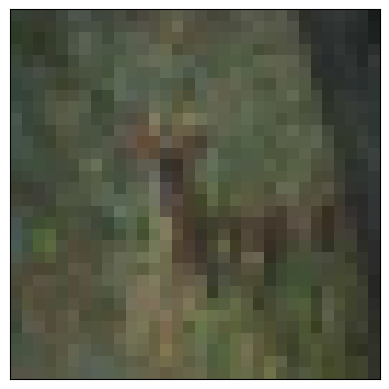

Pixel values:
 53  54  56  54  63  78  76  63  65  73  65  74  80  87  94  86  78  70  71  83  90  86  80  87  68  45  48  49  52  47  41  24 
 46  53  54  57  62  67  72  72  65  74  77  83  83  93 108  85  80  79  77  77  83  93  87  87  80  48  43  46  48  42  39  28 
 45  50  46  54  60  76  90  78  66  81  90  93  86  95  93  83  85  80  80  83  87  86  84  82  78  55  44  44  46  38  36  29 
 54  49  48  55  60  79  88  79  75  75  87  88  99 103  77  84  87  81  81  86  82  71  77  82  81  69  49  42  49  42  35  42 
 59  52  63  54  51  66  80  77  71  82  86  96 102 100  90  90  77  76  81  81  78  91  97  95  93  76  46  40  45  46  36  52 
 59  64  72  68  63  71  74  74  69  90  85  85  85  95  88  77  86  76  81  94  87  85  90  96  86  84  44  43  42  48  43  47 
 54  61  64  66  61  64  69  72  81  91  82  82  86  80  81  69  90  94  95  98  90  77  74  90  88  81  53  43  43  44  41  45 
 53  54  64  77  74  76  80  56  62  92  90  86  94  86  87  78  87 102  96  92  93

In [ ]:
# Display the first image in the dataset as a data matrix
plt.imshow(x_train[10],cmap='gray')
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.show()
# Display the values of each pixel in the image
print("Pixel values:")
for row in x_train[10]:
    for pixel in row:
        print("{:3}".format(pixel[0]), end=" ")
    print()

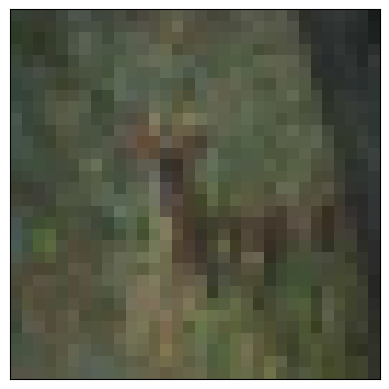

Pixel values:
0.20784313725490197 0.21176470588235294 0.2196078431372549 0.21176470588235294 0.24705882352941178 0.3058823529411765 0.2980392156862745 0.24705882352941178 0.2549019607843137 0.28627450980392155 0.2549019607843137 0.2901960784313726 0.3137254901960784 0.3411764705882353 0.3686274509803922 0.33725490196078434 0.3058823529411765 0.27450980392156865 0.2784313725490196 0.3254901960784314 0.35294117647058826 0.33725490196078434 0.3137254901960784 0.3411764705882353 0.26666666666666666 0.17647058823529413 0.18823529411764706 0.19215686274509805 0.20392156862745098 0.1843137254901961 0.1607843137254902 0.09411764705882353 
0.1803921568627451 0.20784313725490197 0.21176470588235294 0.2235294117647059 0.24313725490196078 0.2627450980392157 0.2823529411764706 0.2823529411764706 0.2549019607843137 0.2901960784313726 0.30196078431372547 0.3254901960784314 0.3254901960784314 0.36470588235294116 0.4235294117647059 0.3333333333333333 0.3137254901960784 0.30980392156862746 0.30196078431

In [ ]:
# Display the first image in the dataset as a data matrix
plt.imshow(x_train_transformed[10],cmap='gray')
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.show()
# Display the values of each pixel in the image
print("Pixel values:")
for row in x_train_transformed[10]:
    for pixel in row:
        print("{}".format(pixel[0]), end=" ")
    print()

##Transfer Learning Project - 2

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Total Validation batchs: 32
Number of test batches: 6
Number of validation batches: 26
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.4050 - loss: 0.8618
Initial Loss: 0.894431471824646, Initial Accuracy: 0.40470296144485474
Epoch 1/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - accuracy: 0.4945 - loss: 0.8518 - val_accuracy: 0.6807 - val_loss: 0.5992
Epoch 2/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.7067 - loss: 0.5789 - val_accuracy: 0.8527 - val_loss: 0.4352
Epoch 3/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7947 - loss: 0.4663 - val_accuracy: 0.9022 - val_loss: 0.3328
Epoch 4/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - accuracy: 0.8501 - loss: 0.3827 - val_accuracy: 0.9257 - val_loss: 0.2778
Epoch 5/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.8678 - loss: 0.3296 - val_accuracy: 0.9418 - val_loss: 0.2332
Epoch 6/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step 

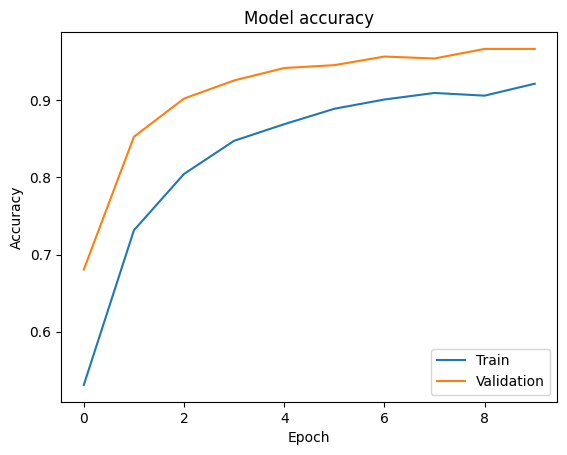

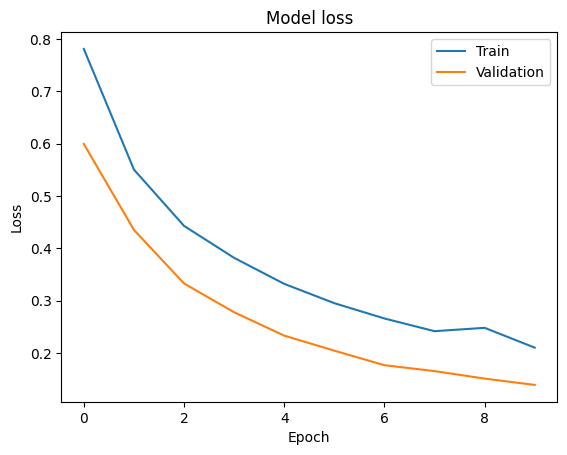

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.models import Model
import requests
import zipfile
import warnings
warnings.filterwarnings('ignore')

data_url='https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

# Download the zip file
response = requests.get(data_url, stream=True)
with open('/content/cats_and_dogs.zip', 'wb') as file:
    for chunk in response.iter_content(chunk_size=1024):

        if chunk:
            file.write(chunk)

with zipfile.ZipFile('/content/cats_and_dogs.zip', 'r') as zip_file:
    zip_file.extractall('/content/')

PATH='/content/cats_and_dogs_filtered'
train_dir='/content/cats_and_dogs_filtered/train'

validation_dir=os.path.join(PATH,'validation')

# print("Train Directory:")

train_ds=tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(160,160),
    batch_size=32
)
# print("Validation Directory")
validation_ds=image_dataset_from_directory(
    validation_dir,
    image_size=(160,160),
    batch_size=32
)

#Splitting the validation data into valedation(80%) and testing(20%)
val_batches=tf.data.experimental.cardinality(validation_ds)
print(f"Total Validation batchs: {val_batches.numpy()}")
test_ds=validation_ds.take(val_batches//5)
print('Number of test batches: %d'% tf.data.experimental.cardinality(test_ds))
validation_ds=validation_ds.skip(val_batches//5)
print(f'Number of validation batches: {tf.data.experimental.cardinality(validation_ds)}')

#caching
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

#Data Augmentation
data_augmentation=tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2)
])

preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
normalization_layer = tf.keras.layers.Rescaling(1./255)
img_shape=(160,160,3)
base_model=tf.keras.applications.MobileNetV2(input_shape=img_shape,weights='imagenet',include_top=False)

image_batch, label_batch=next(iter(train_ds))
feature_batch=base_model(image_batch)

base_model.trainable=False
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average=global_average_layer(feature_batch)

prediction_layer=tf.keras.layers.Dense(1)
prediction_batch=prediction_layer(feature_batch_average)

# tensorflow functional API
inputs=tf.keras.Input(shape=(160,160,3))
x=data_augmentation(inputs)
x=preprocess_input(x)
x=base_model(x,training=False)
x=global_average_layer(x)
x=tf.keras.layers.Dropout(0.2)(x)
outputs=prediction_layer(x)
model=tf.keras.Model(inputs,outputs)

#tensorflow Sequential API
# model=tf.keras.Sequential([
#     tf.keras.layers.Input(shape=(160,160,3)),
#     data_augmentation,
#     normalization_layer,
#     tf.keras.layers.Lambda(preprocess_input),
#     base_model,
#     global_average_layer,
#     tf.keras.layers.Dropout(0.2),
#     prediction_layer

# ])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0,name='accuracy')])

loss0,accuracy0=model.evaluate(validation_ds)
print(f'Initial Loss: {loss0}, Initial Accuracy: {accuracy0}')

history=model.fit(train_ds,
                  epochs=10,
                  validation_data=validation_ds,
                  verbose=1)


# Plot training & validation accuracy and loss
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


In [ ]:
32*32

1024

In [ ]:
class_names=train_ds.class_names
print(class_names)

['cats', 'dogs']


['cats', 'dogs']
(50, 160, 160, 3)
(50,)
tf.Tensor(0, shape=(), dtype=int32)
cats
tf.Tensor(0, shape=(), dtype=int32)
cats
tf.Tensor(0, shape=(), dtype=int32)
cats
tf.Tensor(1, shape=(), dtype=int32)
dogs
tf.Tensor(1, shape=(), dtype=int32)
dogs
tf.Tensor(0, shape=(), dtype=int32)
cats
tf.Tensor(1, shape=(), dtype=int32)
dogs
tf.Tensor(1, shape=(), dtype=int32)
dogs
tf.Tensor(0, shape=(), dtype=int32)
cats


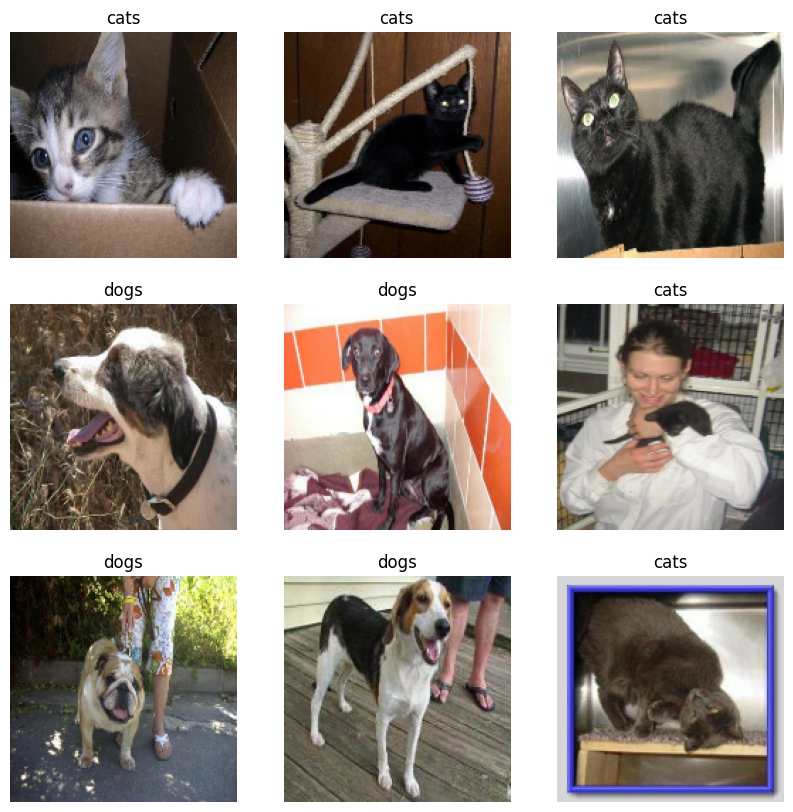

In [ ]:
class_names=train_ds.class_names
print(class_names)

plt.figure(figsize=(10,10))
for images,classes in train_ds.take(1):
    print(images.shape)
    print(classes.shape)
    for i in range(9):
        print(classes[i])
        print(class_names[classes[i]])
        ax=plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[classes[i]])
        plt.axis("off")

In [ ]:
val_batches=tf.data.experimental.cardinality(validation_ds)
print(f"Total Validation batchs: {val_batches.numpy()}")
test_ds=validation_ds.take(val_batches//5)
print('Number of test batches: %d'% tf.data.experimental.cardinality(test_ds))
validation_ds=validation_ds.skip(val_batches//5)
print(f'Number of validation batches: {tf.data.experimental.cardinality(validation_ds)}')
#

Total Validation batchs: 20
Number of test batches: 4
Number of validation batches: 16


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
validation_ds = validation_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)


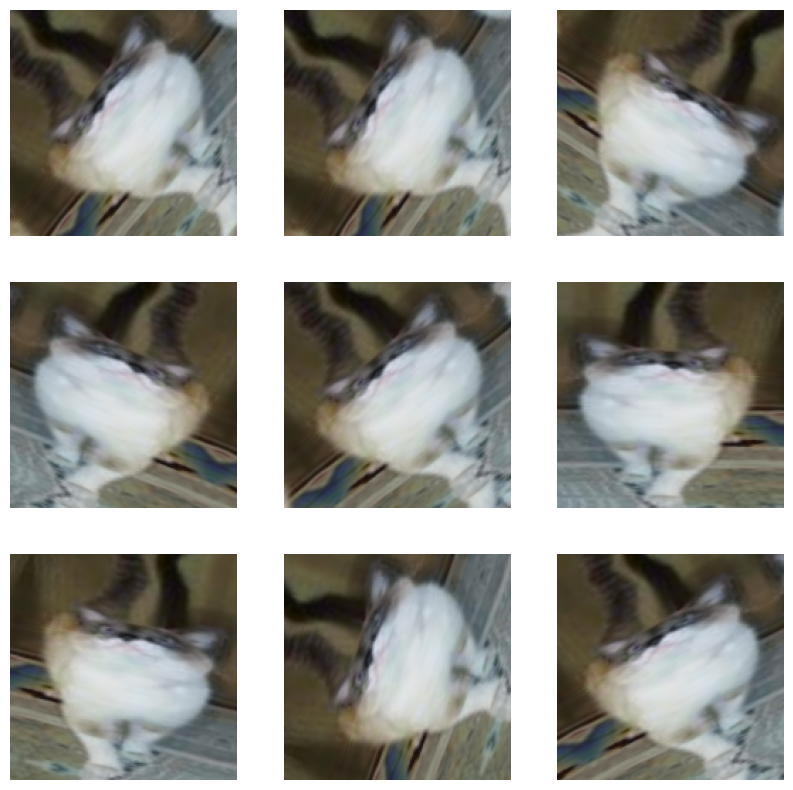

In [ ]:
data_augmentation=tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2)
])

for image,_ in train_ds.take(1):
    plt.figure(figsize=(10,10))
    first_image=image[1]
    for i in range(9):
        ax=plt.subplot(3,3,i+1)
        augmented_image=data_augmentation(tf.expand_dims(first_image,0))
        plt.imshow(augmented_image[0]/255)
        plt.axis('off')

In [ ]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)

img_shape=(160,160,3)
base_model=tf.keras.applications.MobileNetV2(input_shape=img_shape,include_top=False,weights='imagenet')

image_batch, label_batch=next(iter(train_ds))
feature_batch=base_model(image_batch)

print(feature_batch.shape)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
(50, 5, 5, 1280)


In [ ]:
base_model.trainable=False
base_model.summary()


Model: "mobilenetv2_1.00_160"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 80, 80,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 80, 80,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 80, 80,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 80, 80,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 80, 80,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 80, 80,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 81, 81,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 40, 40,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 40, 40,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average=global_average_layer(feature_batch)
print(feature_batch_average.shape)

(50, 1280)


In [ ]:
prediction_layer=tf.keras.layers.Dense(1)
prediction_batch=prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(50, 1)


In [ ]:
from tensorflow.keras.models import Model
inputs=tf.keras.Input(shape=(160,160,3))
x=data_augmentation(inputs)
x=preprocess_input(x)
x=base_model(x,training=False)
x=global_average_layer(x)
x=tf.keras.layers.Dropout(0.2)(x)
outputs=prediction_layer(x)
model=tf.keras.Model(inputs,outputs)

model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_160            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0,name='accuracy')])

In [ ]:
loss0,accuracy0=model.evaluate(validation_ds)
print(f'Initial Loss: {loss0}, Initial Accuracy: {accuracy0}')

16/16 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.2879 - loss: 1.0931
Initial Loss: 1.0934394598007202, Initial Accuracy: 0.3050000071525574


In [ ]:
history=model.fit(train_ds,
                  epochs=10,
                  validation_data=validation_ds,
                  verbose=1)

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3747 - loss: 1.0135

##Classification using Transfer Learning

Found 3670 files belonging to 5 classes.
Using 2936 files for training.
Found 3670 files belonging to 5 classes.
Using 734 files for validation.
Epoch 1/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - accuracy: 0.4326 - loss: 4.0971 - val_accuracy: 0.2398 - val_loss: 4.0769
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6944 - loss: 0.8586 - val_accuracy: 0.2629 - val_loss: 3.5489
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.8303 - loss: 0.4704 - val_accuracy: 0.3297 - val_loss: 4.1749
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.9327 - loss: 0.2192 - val_accuracy: 0.3706 - val_loss: 3.2806
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9745 - loss: 0.1010 - val_accuracy: 0.5272 - val_loss: 1.8418
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9875 - loss: 0.0567 - val_accuracy: 0.5817 - val_loss: 1.5354
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.9826 - loss: 0.0757 - val_a

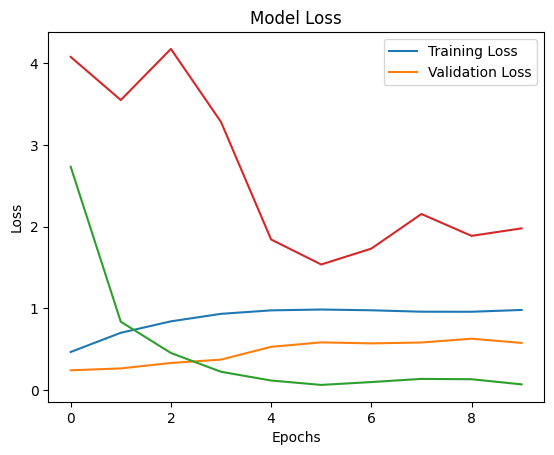

CPU times: user 27 s, sys: 4.51 s, total: 31.5 s
Wall time: 48.6 s


In [ ]:
%%time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
import tensorflow as tf
import requests
import zipfile,tarfile
import pathlib
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping

dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data=requests.get(dataset_url,stream=True)
with open('/content/flowers_dataset.tgz','wb') as file:
    for chunk in data.iter_content(chunk_size=1024):
        if chunk:
            file.write(chunk)

with tarfile.open('/content/flowers_dataset.tgz','r:gz') as tar_file:
    tar_file.extractall('/content')

train_dataset=image_dataset_from_directory(
    '/content/flower_photos',
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(180,180),
    batch_size=32
)
validation_dataset=image_dataset_from_directory(
    '/content/flower_photos',
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(180,180),
    batch_size=32
)

#saving the data set in a ceche
AUTOTUNE=tf.data.AUTOTUNE
train_ds=train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_ds=validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)


# normalization_layer = layers.Rescaling(1./255) # rescale pixel values from [0, 255] to [0, 1]

# normalized_ds = train_ds.map(lambda x,y:(normalization_layer(x),y))
# image_batch, labels_batch = next(iter(normalized_ds))
# first_image=image_batch[0]
# print(np.min(first_image),np.max(first_image))

num_of_classes=len(train_dataset.class_names)


model=Sequential([
    layers.Rescaling(1./255,input_shape=(180,180,3)),

    layers.Conv2D(filters=16,kernel_size=(3,3),padding='same',activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu'),
    layers.BatchNormalization(),
    layers.AveragePooling2D(pool_size=(2,2)),

    layers.Flatten(),


    layers.Dense(128,activation='relu'),

    layers.Dense(5,activation='softmax')

])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history=model.fit(train_ds,epochs=10,validation_data=validation_ds,verbose=1,batch_size=32)

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training Accuracy','Validation Accuracy'])

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training Loss','Validation Loss'])
plt.show()

Found 3670 files belonging to 5 classes.
Using 2936 files for training.
Found 3670 files belonging to 5 classes.
Using 734 files for validation.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - accuracy: 0.4097 - loss: 2.1435 - val_accuracy: 0.2480 - val_loss: 4.2385
Epoch 2/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - accuracy: 0.4585 - loss: 1.2941 - val_accuracy: 0.2616 - val_loss: 6.2292
Epoch 3/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - accuracy: 0.5085 - loss: 1.2503 - val_accuracy: 0.2861 - val_loss: 5.9585
Epoch 4/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - accuracy: 0.5575 - loss: 1.1234 - val_accuracy: 0.4455 - val_loss: 2.3675
Epoch 5/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - accuracy: 0.5564 - loss: 1.0862 - val_accuracy: 0.5422 - val_loss: 1.3687
Epoch 6/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.5422 - loss: 1.1085 - val_accuracy: 0.5995 - val_loss: 1.1333
Epoch 7/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - accuracy: 0.5682 - loss: 1.0619 - val_accuracy: 0.6444 - val_loss: 0.9327
Epoch 8/25
92/92 ━━━━━━━━━━━━━━━━━━━━ 8s 84ms/step - accuracy: 0.5756 - loss: 1.0117 - val_accuracy: 0.6471 

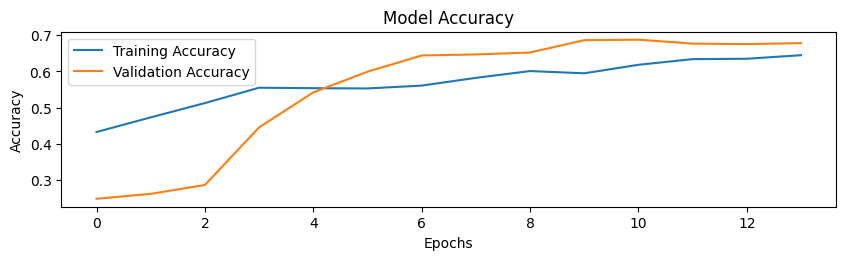

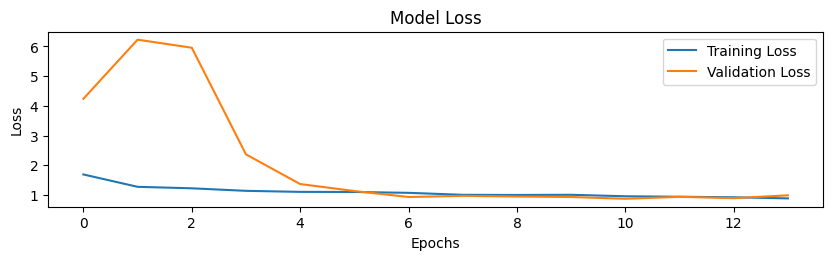

CPU times: user 46.1 s, sys: 9.51 s, total: 55.6 s
Wall time: 2min 34s


In [ ]:
# with data Augmentation and Regularization(Dropout layers)
%%time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
import tensorflow as tf
import requests
import zipfile,tarfile
import pathlib
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping

dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data=requests.get(dataset_url,stream=True)
with open('/content/flowers_dataset.tgz','wb') as file:
    for chunk in data.iter_content(chunk_size=1024):
        if chunk:
            file.write(chunk)

with tarfile.open('/content/flowers_dataset.tgz','r:gz') as tar_file:
    tar_file.extractall('/content')

train_dataset=image_dataset_from_directory(
    '/content/flower_photos',
    validation_split=0.2,
    subset='training',
    seed=123,
    image_size=(180,180),
    batch_size=32
)
validation_dataset=image_dataset_from_directory(
    '/content/flower_photos',
    validation_split=0.2,
    subset='validation',
    seed=123,
    image_size=(180,180),
    batch_size=32
)

#saving the data set in a ceche
AUTOTUNE=tf.data.AUTOTUNE
train_ds=train_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_ds=validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)


# normalization_layer = layers.Rescaling(1./255) # rescale pixel values from [0, 255] to [0, 1]

# normalized_ds = train_ds.map(lambda x,y:(normalization_layer(x),y))
# image_batch, labels_batch = next(iter(normalized_ds))
# first_image=image_batch[0]
# print(np.min(first_image),np.max(first_image))

num_of_classes=len(train_dataset.class_names)

data_augmentation=tf.keras.Sequential([
    layers.RandomFlip('horizontal',input_shape=(180,180,3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1)
])
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

model=Sequential([
    data_augmentation,
    layers.Rescaling(1./255),

    layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Conv2D(filters=128,kernel_size=(3,3),padding='same',activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(pool_size=(2,2)),

    layers.Flatten(),
    layers.Dropout(0.2),#it is not droping,it's turn off the neurons

    layers.Dense(128,activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_of_classes,activation='softmax')

])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=[tf.keras.metrics.SparseCategoricalAccuracy(name='accuracy')])

history=model.fit(train_ds,epochs=25,validation_data=validation_ds,verbose=1,batch_size=32,callbacks=[early_stop])

plt.figure(figsize=(10,5))
plt.subplot(2,1,1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training Accuracy','Validation Accuracy'])
plt.show()

plt.figure(figsize=(10,5))
plt.subplot(2,1,2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training Loss','Validation Loss'])
plt.show()

###Pridict on new data

In [ ]:
sunflower_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/592px-Red_sunflower.jpg"
import requests
data=requests.get(sunflower_url,stream=True)
# get the image
with open('/content/sunflower.jpg','wb') as file:
    for chunk in data.iter_content(chunk_size=1024):
        if chunk:
            file.write(chunk)

# plt.imshow(plt.imread('/content/sunflower.jpg'))
image=tf.keras.utils.load_img('/content/sunflower.jpg',target_size=(180,180))
# plt.imshow(image)
input_arr=tf.keras.utils.img_to_array(image)
# input_arr=np.array([input_arr])
input_arr=tf.expand_dims(input_arr,0)
predictions=model.predict(input_arr)
# print(predictions)
# print(np.argmax(predictions))
class_names=train_dataset.class_names
score=tf.nn.softmax(predictions)
print(score)
print(f'This image belongs to class: {class_names[np.argmax(score)]}')

# print(train_dataset.class_names[np.argmax(score)])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
tf.Tensor([[0.15236016 0.15216012 0.15198077 0.37876013 0.16473882]], shape=(1, 5), dtype=float32)
This image belongs to class: sunflowers


###Saving the model with tensorflow lite

In [ ]:
# convert the model
converter=tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model=converter.convert()

# save the model
with open('/content/model.tflite','wb') as f:
    f.write(tflite_model)


Saved artifact at '/tmp/tmp9b0u29it'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 180, 180, 3), dtype=tf.float32, name='keras_tensor_4')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  138179773437264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773438032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773440720: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773440336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773439760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773437072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773442064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773443600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773443792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773443024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138179773442

In [ ]:
interpreter.get_signature_list()

{'serving_default': {'inputs': ['keras_tensor_4'], 'outputs': ['output_0']}}

In [ ]:
TF_MODEL_FILE_PATH = '/content/model.tflite'
# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path=TF_MODEL_FILE_PATH)

# Allocate tensors before setting values
interpreter.allocate_tensors()
# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Set input tensor
interpreter.set_tensor(input_details[0]['index'], input_arr)

# Run inference
interpreter.invoke()

# Get output tensor
prediction_lite = interpreter.get_tensor(output_details[0]['index'])

# Calculate softmax score
score_list = tf.nn.softmax(prediction_lite)

print(f'This image belongs to class: {class_names[np.argmax(score_list)]}')

This image belongs to class: sunflowers


['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


<Figure size 1000x1000 with 0 Axes>

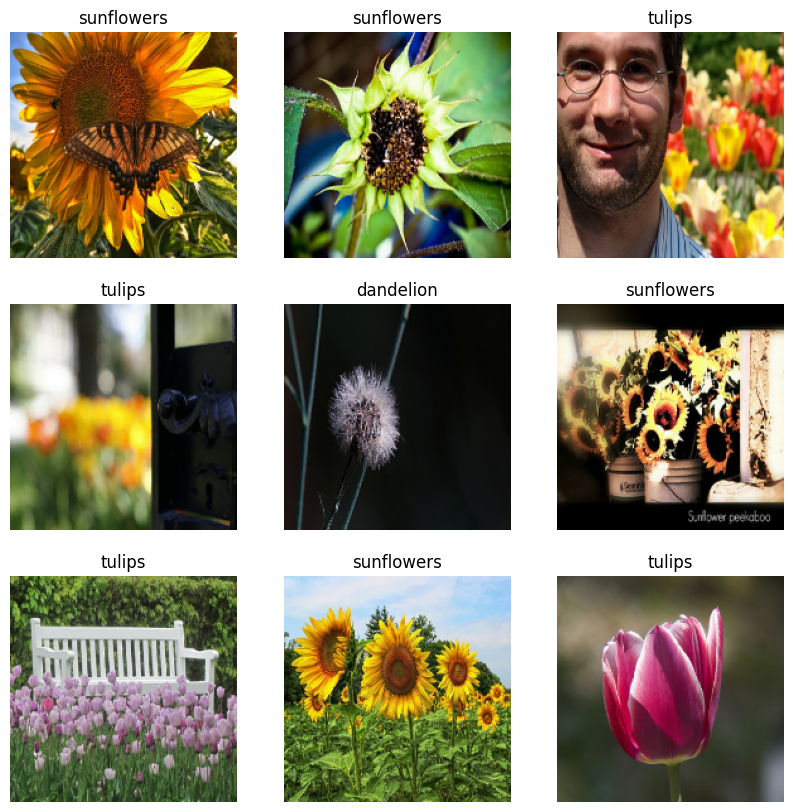

In [ ]:
class_names=train_dataset.class_names
print(class_names)
plt.figure(figsize=(10,10))
plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
for batch,label in train_dataset:
    print(batch.shape)
    print(label.shape)
    break

(32, 180, 180, 3)
(32,)


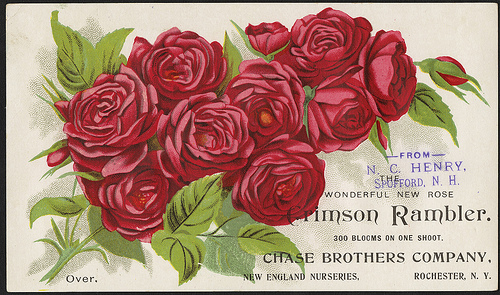

In [ ]:
data_dir=pathlib.Path('/content/flower_photos')
roses=list(data_dir.glob('roses/*'))
PIL.Image.open(str(roses[10]))

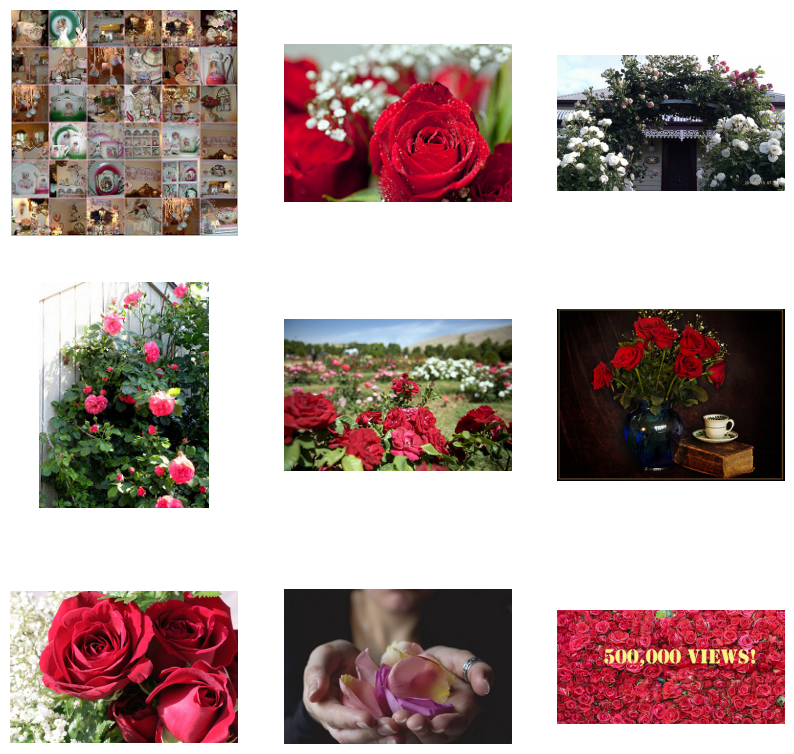

In [ ]:
import pathlib
import PIL

data_dir = pathlib.Path('/content/flower_photos')  # Point to the extracted directory
roses = list(data_dir.glob('roses/*'))  # Use glob to find files within the 'roses' subdirectory
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(PIL.Image.open(str(roses[i])))

    plt.axis('off')


##Feature Extraction of MobileNetV2

##Ploting the Images

(32, 180, 180, 3)
(32,)


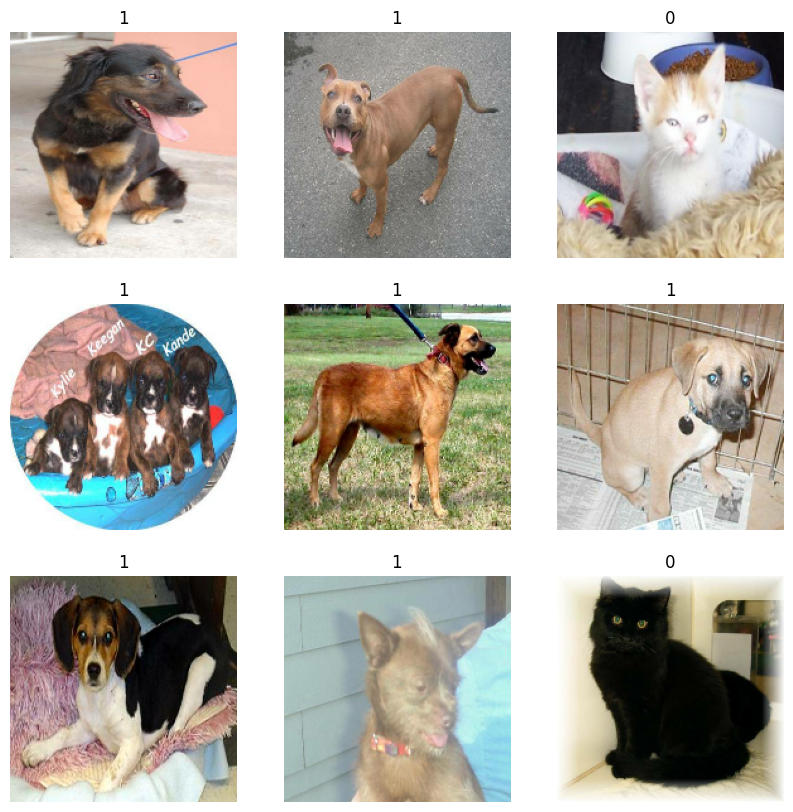

In [ ]:
plt.figure(figsize=(10,10))
for images,labels in training_dataset.take(1):
    print(images.shape)
    print(labels.shape)
    for i in range(9):
        ax=plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        plt.title(labels[i].numpy())
        plt.axis('off')


##Converting the Validation Into Test & Validation

In [ ]:
total_val_batches=tf.data.experimental.cardinality(validation_dataset)
print(total_val_batches.numpy())
test_dataset=validation_dataset.take(total_val_batches//5)
print(tf.data.experimental.cardinality(test_dataset).numpy())
validation_dataset=validation_dataset.skip(total_val_batches//5)
print(tf.data.experimental.cardinality(validation_dataset).numpy())

32
6
26


##Data Augmentation

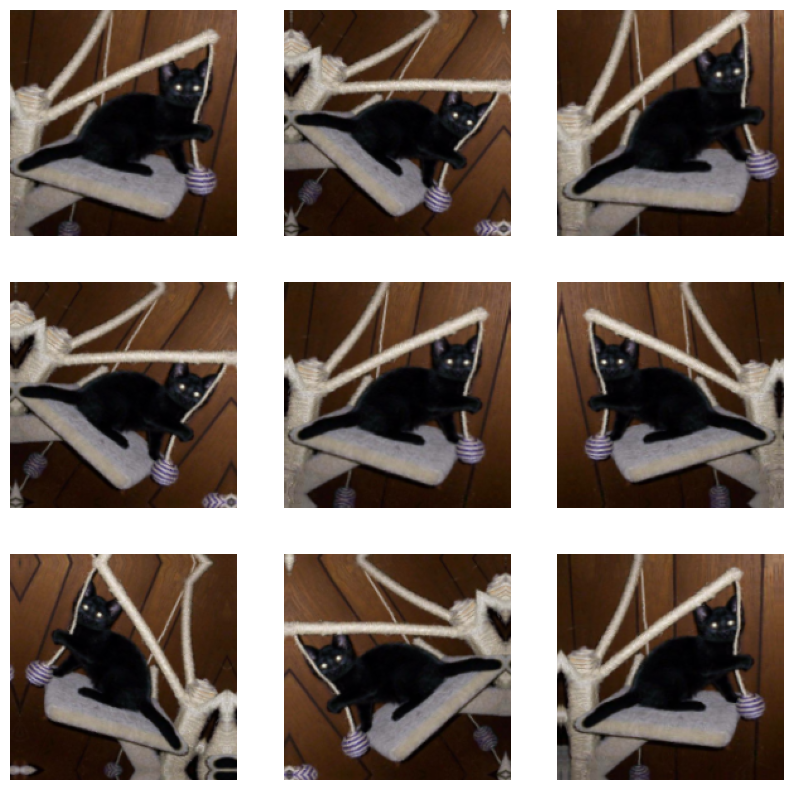

In [ ]:
data_augmentation=Sequential([
    layers.Input(shape=(180, 180, 3)),  # Define Input layer first
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1)
])
plt.figure(figsize=(10,10))
for images,_ in training_dataset.take(1):
    first_image=images[0]

    for i in range(9):
        ax=plt.subplot(3,3,i+1)
        augmented_image=data_augmentation(tf.expand_dims(first_image,0))
        plt.imshow(augmented_image[0]/255)
        plt.axis('off')

##Rescaling the Pixel Values

In [ ]:
preprocess_input=tf.keras.applications.mobilenet_v2.preprocess_input

"""this layer is specially designed for mobileNet model to convert
the input into the form of mobilenet accepts
but you can do it customly by Rescaling(1./127)"""


'this layer is specially designed for mobileNet model to convert\nthe input into the form of mobilenet accepts\nbut you can do it customly by Rescaling(1./127)'

##Building Base Model

In [ ]:
base_model=tf.keras.applications.MobileNetV2(input_shape=(180,180,3),
                                             include_top=False,
                                             weights='imagenet')


<ipython-input-28-960506dbef62>:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model=tf.keras.applications.MobileNetV2(input_shape=(180,180,3),


##Feature Extraction

32
32


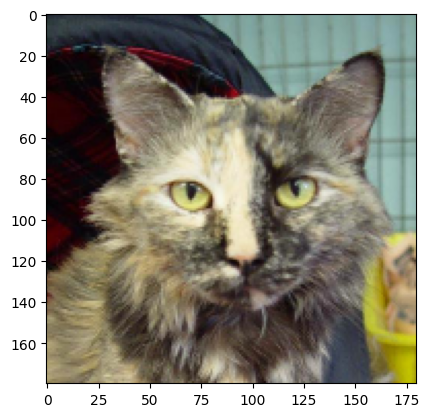

In [ ]:
image_batch, label_batch=next(iter(training_dataset))
plt.imshow(image_batch[0].numpy().astype('uint8'))
# print(len(base_model.layers))
print(len(image_batch))
# label_batch
feature_batch=base_model(image_batch)
print(len(feature_batch))
base_model.trainalbe=False

In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 180, 180,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 90, 90,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 90, 90,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 90, 90,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 90, 90,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 90, 90,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 90, 90,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 90, 90,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 90, 90,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 90, 90,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 90, 90,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 90, 90,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 91, 91,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 45, 45,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 45, 45,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 45, 45,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 45, 45,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
print(len(base_model.layers))
print(len(base_model.trainable_variables))


154
156


##Add a classification head

In [ ]:
global_average_layer=tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average=global_average_layer(feature_batch)
print(feature_batch_average.shape)

prediction_layer=tf.keras.layers.Dense(1)
prediction_batch=prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1280)
(32, 1)


In [ ]:
inputs = tf.keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)


In [ ]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_2 (TrueDivide)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_2 (Subtract)           │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 2,225,153 (8.49 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:

len(model.trainable_variables)

158

In [ ]:
%%time
# # for window/linux users
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0, name='accuracy')])



initial_epochs = 10

loss0, accuracy0 = model.evaluate(validation_dataset)

26/26 ━━━━━━━━━━━━━━━━━━━━ 24s 838ms/step - accuracy: 0.4824 - loss: 0.9517
CPU times: user 31.4 s, sys: 7.65 s, total: 39.1 s
Wall time: 42.8 s


In [ ]:
%%time
history = model.fit(training_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset, verbose=1)

Epoch 1/10


KeyboardInterrupt: 

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.


<timed exec>:61: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.


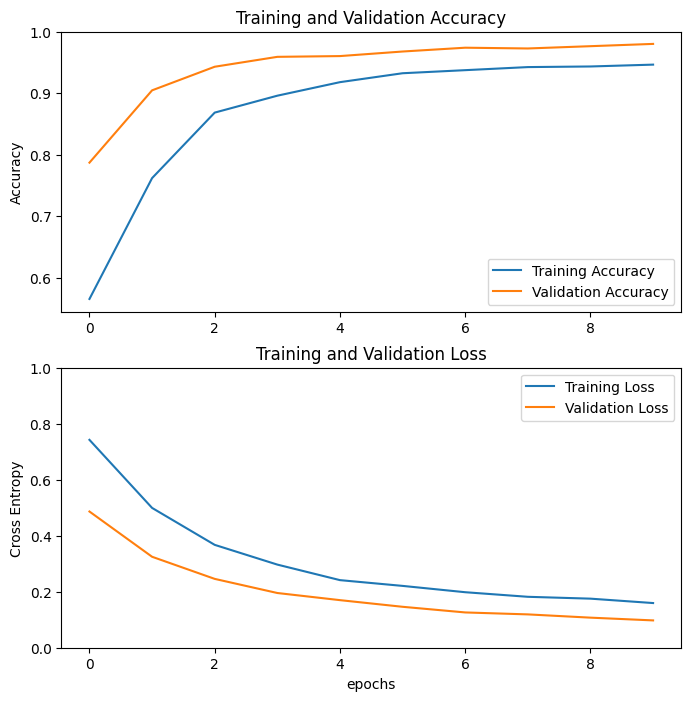

CPU times: user 1min 7s, sys: 3.95 s, total: 1min 11s
Wall time: 58.4 s


In [ ]:
%%time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
import tensorflow as tf
import requests
import zipfile,tarfile
import pathlib
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping


_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
data=requests.get(_URL,stream=True)
with open('/content/cats_and_dogs.zip','wb') as zip_file:
    for chunk in data.iter_content(chunk_size=1024):
        if chunk:
            zip_file.write(chunk)

with zipfile.ZipFile('/content/cats_and_dogs.zip','r') as folder:
    folder.extractall('/content')

training_dataset=image_dataset_from_directory(
    '/content/cats_and_dogs_filtered/train',
    image_size=(180,180),
    batch_size=32,
    shuffle=True
)
validation_dataset=image_dataset_from_directory(
    '/content/cats_and_dogs_filtered/validation',
    image_size=(180,180),
    batch_size=32
)

# Third step

total_val_batches=tf.data.experimental.cardinality(validation_dataset)
test_dataset=validation_dataset.take(total_val_batches//5)
validation_dataset=validation_dataset.skip(total_val_batches//5)

# Fouth step
AUTOTUNE=tf.data.AUTOTUNE
training_ds=training_dataset.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
validation_ds=validation_dataset.cache().prefetch(buffer_size=AUTOTUNE)

# firth step
data_augmentation=Sequential([
    layers.Input(shape=(180, 180, 3)),  # Define Input layer first
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1)
])

# sixth step
preprocess_input=tf.keras.applications.mobilenet_v2.preprocess_input

# seventh step
base_model=tf.keras.applications.MobileNetV2(input_shape=(180,180,3),
                                             include_top=False,
                                             weights='imagenet')
base_model.trainable = False

# Eighth step
# feature extraction

image_batch, label_batch = next(iter(training_dataset))
feature_batch = base_model(image_batch)

# Ninth Step
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
prediction_layer = tf.keras.layers.Dense(1)
prediction_batch = prediction_layer(feature_batch_average)

# Tenth step
# Model building

inputs = tf.keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0, name='accuracy')])

initial_epochs=10
history = model.fit(training_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset, verbose=0)





acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epochs')
plt.show()

In [ ]:

# print final training and validation accuracy
loss, accuracy = model.evaluate(training_dataset)
print("Training accuracy: {:.2f}".format(accuracy))

loss, accuracy = model.evaluate(validation_dataset)
print("Validation accuracy: {:.2f}".format(accuracy))

63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9696 - loss: 0.1088
Training accuracy: 0.97
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.9856 - loss: 0.0886
Validation accuracy: 0.99


#Fine-Tuning MobileNetV2

In [ ]:
fine_tune_at=100
base_model.trainable=True
num_of_frozen_layers=0
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable=False
    num_of_frozen_layers+=1

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0, name='accuracy')])

model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,862,721 (7.11 MB)

 Non-trainable params: 396,544 (1.51 MB)

In [ ]:
len(model.trainable_variables)
len(base_model.trainable_weights)


54

In [ ]:
fine_tune_epochs=10
total_epochs=initial_epochs+fine_tune_epochs
history_fine=model.fit(training_dataset,
                       epochs=total_epochs,
                       initial_epoch=history.epoch[-1],
                       validation_data=validation_dataset,verbose=1)

Epoch 10/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - accuracy: 0.9000 - loss: 0.2274 - val_accuracy: 0.9814 - val_loss: 0.0517
Epoch 11/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 109ms/step - accuracy: 0.9730 - loss: 0.0769 - val_accuracy: 0.9802 - val_loss: 0.0475
Epoch 12/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - accuracy: 0.9821 - loss: 0.0527 - val_accuracy: 0.9839 - val_loss: 0.0501
Epoch 13/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - accuracy: 0.9863 - loss: 0.0377 - val_accuracy: 0.9839 - val_loss: 0.0557
Epoch 14/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - accuracy: 0.9895 - loss: 0.0253 - val_accuracy: 0.9827 - val_loss: 0.0587
Epoch 15/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - accuracy: 0.9847 - loss: 0.0371 - val_accuracy: 0.9765 - val_loss: 0.0793
Epoch 16/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.9947 - loss: 0.0173 - val_accuracy: 0.9851 - val_loss: 0.0654
Epoch 17/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - accuracy: 0.9894 - loss: 0.0417 - val_accura

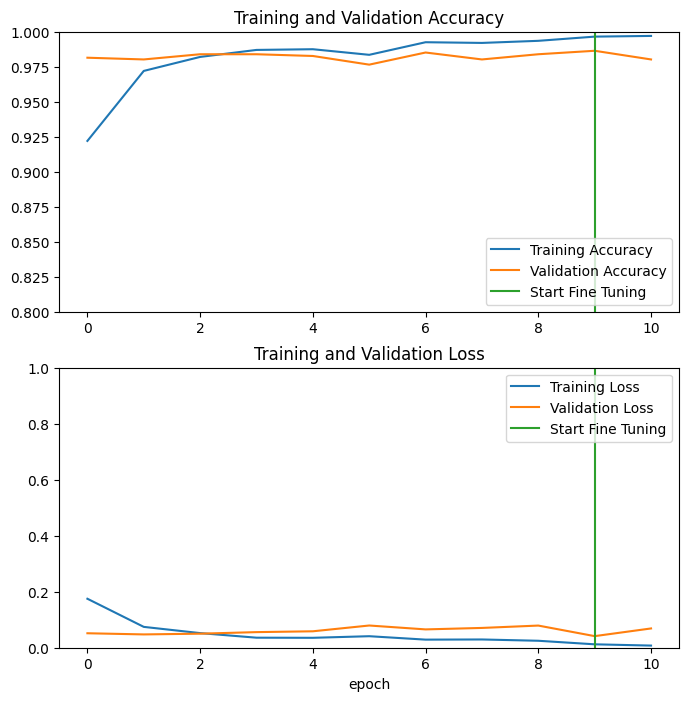

In [ ]:

# Initialize the variables as lists
acc = []
val_acc = []
loss = []
val_loss = []

# Add the history data
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']
loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']


plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:

loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.9795 - loss: 0.1371
Test accuracy : 0.9739583134651184


In [ ]:

# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch).flatten()

# Apply a sigmoid since our model returns logits
predictions = tf.nn.sigmoid(predictions)
predictions = tf.where(predictions < 0.5, 0, 1)

print('Predictions:\n', predictions.numpy())
print('Labels:\n', label_batch)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predictions[i]])
  plt.axis("off")

#Tensor Board

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping,TensorBoard

(x_train,y_train),(x_test,y_test)=mnist.load_data()


x_train_transformed,x_test_transformed=x_train.astype('float32')/255,x_test.astype('float32')/255
y_train_categorical,y_test_categorical=to_categorical(y_train,10),to_categorical(y_test,10)

model=tf.keras.Sequential([
    layers.Input(shape=(28,28,1)),
    layers.Conv2D(filters=16,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Conv2D(filters=32,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Flatten(),
    layers.Dense(10,activation='softmax')
])

early_stopping=EarlyStopping(monitor='val_loss',patience=3)
tensorboard=TensorBoard(log_dir='/content/logs')
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
model.fit(x_train_transformed,y_train_categorical,epochs=10,batch_size=32,validation_split=0.2,callbacks=[early_stopping,tensorboard],verbose=1)



Epoch 1/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 31s 19ms/step - accuracy: 0.8489 - loss: 0.5042 - val_accuracy: 0.9732 - val_loss: 0.0884
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 39s 18ms/step - accuracy: 0.9768 - loss: 0.0737 - val_accuracy: 0.9806 - val_loss: 0.0658
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 40s 17ms/step - accuracy: 0.9828 - loss: 0.0529 - val_accuracy: 0.9836 - val_loss: 0.0551
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 42s 18ms/step - accuracy: 0.9872 - loss: 0.0429 - val_accuracy: 0.9839 - val_loss: 0.0532
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 27s 18ms/step - accuracy: 0.9892 - loss: 0.0337 - val_accuracy: 0.9859 - val_loss: 0.0475
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 42s 19ms/step - accuracy: 0.9909 - loss: 0.0286 - val_accuracy: 0.9872 - val_loss: 0.0448
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 44s 21ms/step - accuracy: 0.9922 - loss: 0.0247 - val_accuracy: 0.9841 - val_loss: 0.0490
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - accuracy: 0.9930 -

##Activate Inline Tensorboard

In [16]:
%load_ext tensorboard

# run tensworboard for recent logs
%tensorboard --logdir /content/logs

Output hidden; open in https://colab.research.google.com to view.

### Hyper-Paramter Tuning and Visualization using Tensorboard

In [ ]:
# Define different optimizers
optimizers = ['SGD', 'Adam']
# optimizer = ['SGD', 'Adam', 'RMSprop', 'Adagrad', 'Adadelta', 'Adamax', 'Nadam']

# Train the model with different optimizers and store each optimizer in a different callback function
for optimizer in optimizers:
    model = Sequential([
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu', input_shape=(28, 28, 1)),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu'),
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((1,1)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(10, activation='softmax')
    ])

    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Define different batch sizes
    batch_sizes = [16, 32, 64, 128]

    # Train the model with different batch sizes and store each batch size in a different callback function
    for batch_size in batch_sizes:
        log_dir = f'./logs/{optimizer}_batch_size_{batch_size}'
        tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
        model.fit(X_train, y_train, epochs=5, batch_size=batch_size, validation_data=(X_test,y_test),
                  callbacks=[tensorboard_callback])

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Run TensorBoard
%tensorboard --logdir=./logs

### Run Hyperparameter tuning and save the best model using TensorBoard.

In [ ]:
%%time
from tensorflow.keras.callbacks import ModelCheckpoint
# Import the ModelCheckpoint callback
# Define different optimizers
optimizers = ['SGD', 'Adam']
# optimizers = ['SGD', 'Adam', 'RMSprop', 'Adadelta', 'Adagrad', 'Adamax', 'Nadam', 'Ftrl']

# Train the model with different optimizers and store each optimizer in a different callback function
for optimizer in optimizers:
    model = Sequential([
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu', input_shape=(28, 28, 1)),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((2,2)),
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu'),
        tf.keras.layers.Conv2D(10, (3, 3), activation='relu'),
        tf.keras.layers.MaxPooling2D((1,1)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(10, activation='softmax')
    ])

    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    # Define different batch sizes
    batch_sizes = [16, 32, 64, 128]

    # Train the model with different batch sizes and store each batch size in a different callback function
    for batch_size in batch_sizes:
        log_dir = f'./logs/{optimizer}_batch_size_{batch_size}'

        # Define the ModelCheckpoint callback to save the best model based on validation accuracy
        checkpoint_callback = ModelCheckpoint(filepath=f'./models/best_model_{optimizer}_batch_size_{batch_size}.h5',
                                              monitor='val_accuracy',
                                              save_best_only=True,
                                              mode='max',
                                              verbose=1)

        tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

        # Train the model with the callbacks
        model.fit(X_train, y_train, epochs=5, batch_size=batch_size, validation_data=(X_test,y_test), callbacks=[tensorboard_callback, checkpoint_callback])

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Run TensorBoard
%tensorboard --logdir=./logs

#Transfer Learning from Hugging Face Transformers

In [3]:
!pip install transformers

###Text Classifier

In [10]:
from transformers import pipeline

# Initialize the sentiment analysis pipeline
sentiment_analyzer=pipeline(task='sentiment-analysis',model='distilbert/distilbert-base-uncased-finetuned-sst-2-english')#,model='nlptown/bert-base-multilingual-uncased-sentiment'

text='I am not with you'
sentiment_analyzer(text)

Device set to use cpu


[{'label': 'NEGATIVE', 'score': 0.9987875819206238}]

##Text Generation

In [12]:
text_generation=pipeline(task='text-generation')
text_generation('I am not with you')

No model was supplied, defaulted to openai-community/gpt2 and revision 607a30d (https://huggingface.co/openai-community/gpt2).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Device set to use cpu
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


[{'generated_text': 'I am not with you. I want you to know that I will be going through this with the full support of you. We will be taking an extended leave of absence at the end of November to ensure the health of our family and friends." That'}]